# What
分类任务，支持两种模式
1. Folder模式，需要输入`train`, `valid`两个测试集对应的目录。`labels.txt`，需要训练的label，里面每个类别一行。
2. List模式，需要输入`train`, `valid`两个测试集对应的训练文件，每行一个样本。`labels.txt`是可选参数，里面每个类别一行。`data_pattern`一个通用的目录，与train、val中的第一列进行拼接。

### 支持的模型名称

模型名称替换代码中的 `model_name`变量的值。

| **模型系列** | **模型名称**                                                 |
| ------------ | ------------------------------------------------------------ |
| AlexNet      | alexnet                                                      |
| VGG          | vgg11, vgg11_bn, vgg13, vgg13_bn, vgg16, vgg16_bn, vgg19_bn, vgg19 |
| ResNet       | resnet18, resnet34, resnet50, resnet101, resnet152, resnext50_32x4d, resnext101_32x8d, wide_resnet50_2, wide_resnet101_2 |
| DenseNet     | densenet121, densenet169, densenet201, densenet161           |
| Inception    | googlenet, inception_v3                                      |
| SqueezeNet   | squeezenet1_0, squeezenet1_1                                 |
| ShuffleNetV2 | shufflenet_v2_x2_0, shufflenet_v2_x0_5, shufflenet_v2_x1_0, shufflenet_v2_x1_5 |
| MobileNet    | mobilenet_v2, mobilenet_v3_large, mobilenet_v3_small         |
| MNASNet      | mnasnet0_5, mnasnet0_75, mnasnet1_0, mnasnet1_3              |
| ViT       | ViT, SimpleViT, Crossformer, TwinsSVT|

![](http://medai.icu/storage/attachments/2023/10/10/RHd9eH5U67VsOP8vqyNyBD5nGYREejkAKx3Jw16X.)

### List模式

在Onekey中List模式一般是采用labelme标注出来的结果，如果要使用自己的数据应用List模式，需要根据自己的实际情况对数据进行处理。

* `train.txt`，训练数据列表，中间用\t（Tab水平制表符）进行分割。
* `val.txt`，验证数据列表，中间用\t（Tab水平制表符）进行分割。
* `labels.txt`，label的集合，表明训练数据多少标签。
* `data_pattern`参数，所有数据存在的目录的公共前缀，如果`train.txt`,`val.txt`文件里面存放的是绝对路径，`data_pattern`设置为None即可。

In [1]:
import os
from onekey_algo.classification.run_classification import main as clf_main
from collections import namedtuple
from onekey_algo import get_param_in_cwd

# 设置参数
compare_settings = get_param_in_cwd('compare_settings')
rand_idx = get_param_in_cwd('rand_index', None)
if rand_idx is None:
    train_f = get_param_in_cwd('train_file') or 'split_info/train-RND-0.txt'
    val_f = get_param_in_cwd('val_file') or 'split_info/val-RND-0.txt'
else:
    train_f = f'split_info/train-RND-{rand_idx}.txt'
    val_f = f'split_info/val-RND-{rand_idx}.txt'
labels_f = 'split_info/labels.txt'
data_pattern =  get_param_in_cwd('data_pattern')
in_channels = get_param_in_cwd('in_channels')

for model_name in get_param_in_cwd('model_names', ['Crossformer']):
    params = dict(train=train_f,
                  valid=val_f,
                  labels_file=labels_f,
                  data_pattern=data_pattern,
                  j=0,
                  max2use=None,
                  val_max2use=None,
                  batch_balance=False,
                  normalize_method='imagenet',
                  model_name=model_name,
                  vit_settings = {'patch_size': 64, 'dim': 1024, 'depth': 6, 'heads': 16, 'mlp_dim': 768},
                  gpus=[0],
                  batch_size=get_param_in_cwd('batch_size', 32),
                  epochs=get_param_in_cwd('epoch', 50),
                  init_lr=get_param_in_cwd('init_lr', 0.01),
                  optimizer=get_param_in_cwd('optimizer', 'sgd'),
                  retrain=None,
                  model_root=os.path.join(get_param_in_cwd('model_root', 'dl_models')),
                  add_date=False,
                  iters_start=0,
                  iters_verbose=1,
                  save_per_epoch=False,
                  in_channels=in_channels,
                  pretrained=False)
    # 训练模型
    Args = namedtuple("Args", params)
    clf_main(Args(**params))

[2026-08-30 16:45:57 - <frozen core.transformer_factory>:  45]	INFO	使用10通道，-([0.485, 0.456, 0.406, 0.485, 0.456, 0.406, 0.485, 0.456, 0.406, 0.485])/ ([0.229, 0.224, 0.225, 0.229, 0.224, 0.225, 0.229, 0.224, 0.225, 0.229])
[2026-08-30 16:45:57 - <frozen core.transformer_factory>:  45]	INFO	使用10通道，-([0.485, 0.456, 0.406, 0.485, 0.456, 0.406, 0.485, 0.456, 0.406, 0.485])/ ([0.229, 0.224, 0.225, 0.229, 0.224, 0.225, 0.229, 0.224, 0.225, 0.229])
[2026-08-30 16:45:57 - <frozen onekey_algo.datasets.ClassificationDataset>: 660]	INFO	WE RECOMMEND YOU USE SPECIFY dataset_name LIKE list for ListDataset OR folder for FolderDataset.
[2026-08-30 16:45:57 - <frozen onekey_algo.datasets.ClassificationDataset>:  83]	INFO	Parsing record file split_info/train-RND-0.txt
[2026-08-30 16:45:57 - <frozen onekey_algo.datasets.ClassificationDataset>:  86]	INFO		Checking file exists in split_info/train-RND-0.txt
[2026-08-30 16:45:57 - <frozen onekey_algo.datasets.ClassificationDataset>: 673]	INFO	We infer your 

ValueError: Crossformer not supported!

In [2]:
import os
import pandas as pd
from datetime import datetime
from onekey_algo import get_param_in_cwd

os.makedirs('img', exist_ok=True)
os.makedirs('results', exist_ok=True)
subsets = get_param_in_cwd('subsets')
label_file = get_param_in_cwd('label_file')
model_root = get_param_in_cwd('model_root')
sel_models = [get_param_in_cwd('sel_model_name') or get_param_in_cwd('model_names')[0]]
group_info = pd.read_csv(label_file)
group_info

,ID,label,group
0,193.nii.gz,1,train
1,334.nii.gz,0,train
2,259.nii.gz,1,train
3,66.nii.gz,0,train
4,56.nii.gz,0,train
...,...,...,...
592,sl_215.nii.gz,0,test
593,sl_216.nii.gz,0,test
594,sl_217.nii.gz,1,test
595,sl_218.nii.gz,1,test


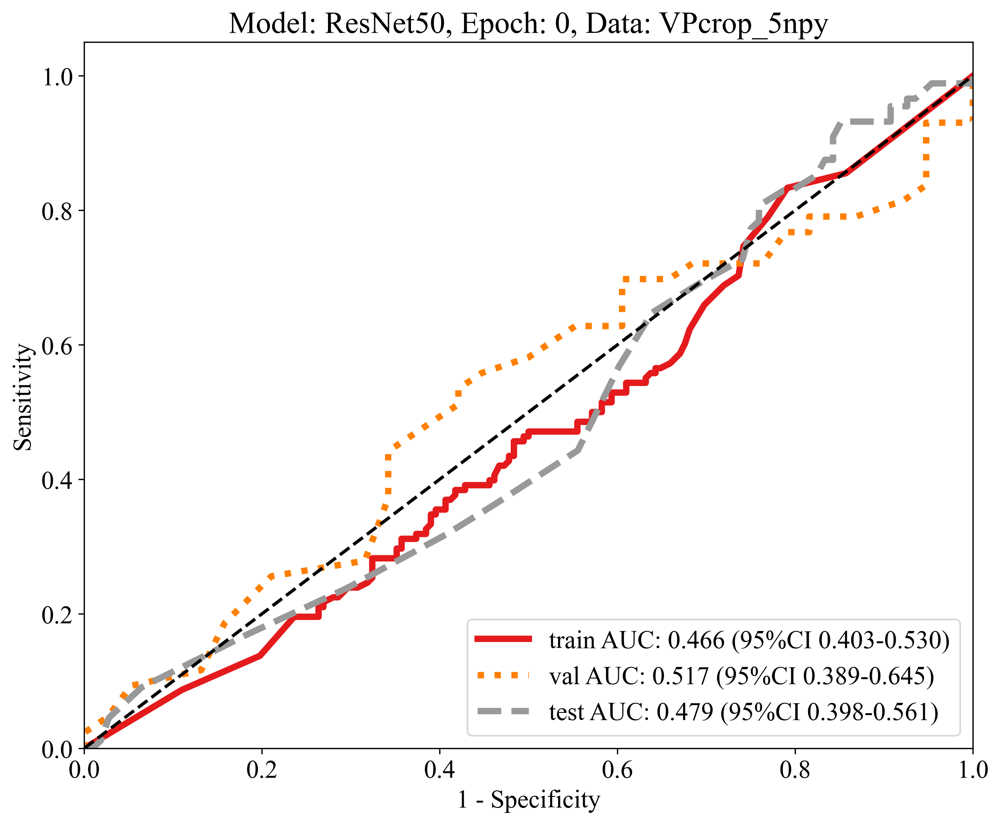

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.478,0.466,0.4028-0.5298,0.833,0.209,0.444,0.623,0.444,0.833,0.579,0.002,train,0
1,resnet50,0.556,0.517,0.3889-0.6448,0.535,0.579,0.590,0.524,0.590,0.535,0.561,0.055,val,0
2,resnet50,0.500,0.479,0.3979-0.5609,0.932,0.148,0.471,0.727,0.471,0.932,0.626,0.043,test,0


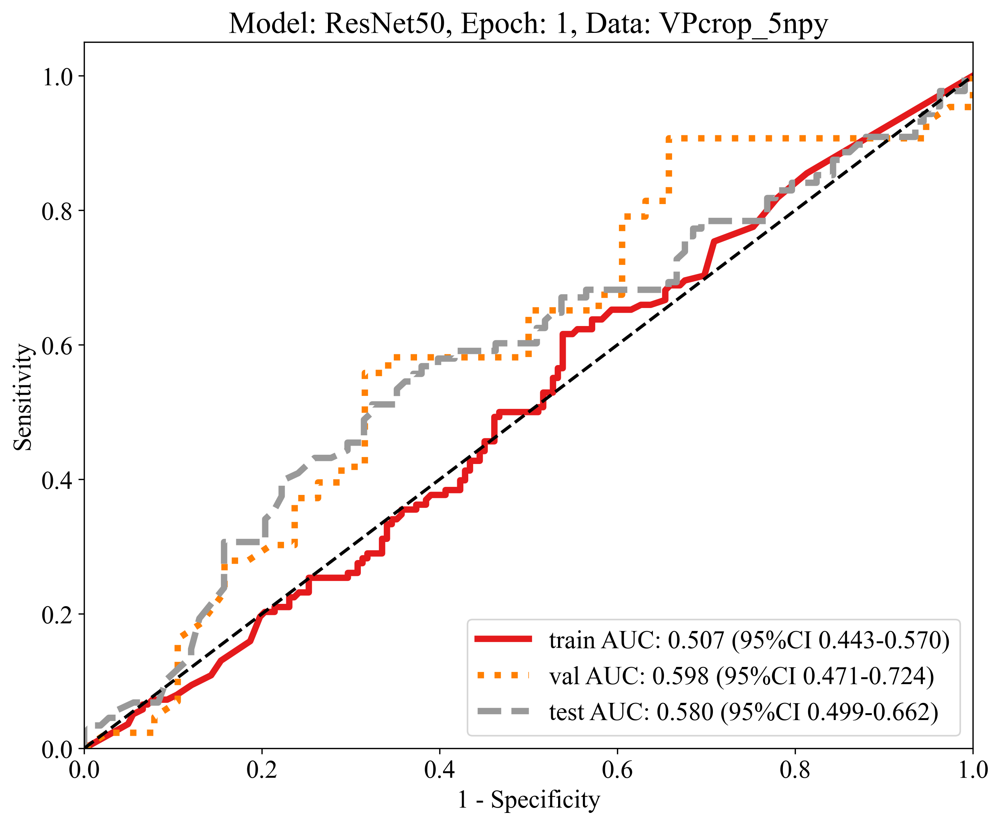

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.528,0.507,0.4433-0.5703,0.616,0.462,0.464,0.613,0.464,0.616,0.530,0.044,train,1
1,resnet50,0.642,0.598,0.4709-0.7244,0.907,0.342,0.609,0.765,0.609,0.907,0.729,0.092,val,1
2,resnet50,0.597,0.580,0.4987-0.6618,0.568,0.620,0.549,0.638,0.549,0.568,0.559,0.520,test,1


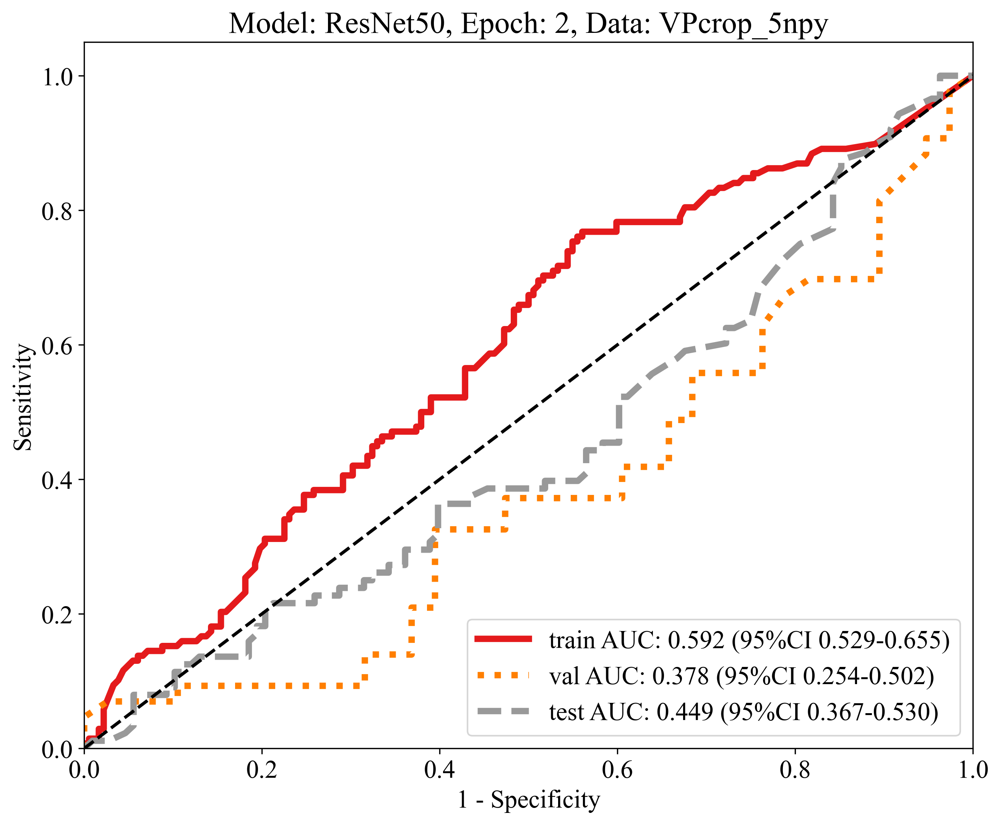

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.581,0.592,0.5294-0.6552,0.768,0.440,0.510,0.714,0.510,0.768,0.613,0.146,train,2
1,resnet50,0.494,0.378,0.2542-0.5016,0.047,1.000,1.000,0.481,1.000,0.047,0.089,1.000,val,2
2,resnet50,0.469,0.449,0.3670-0.5303,1.000,0.037,0.458,1.000,0.458,1.000,0.629,0.759,test,2


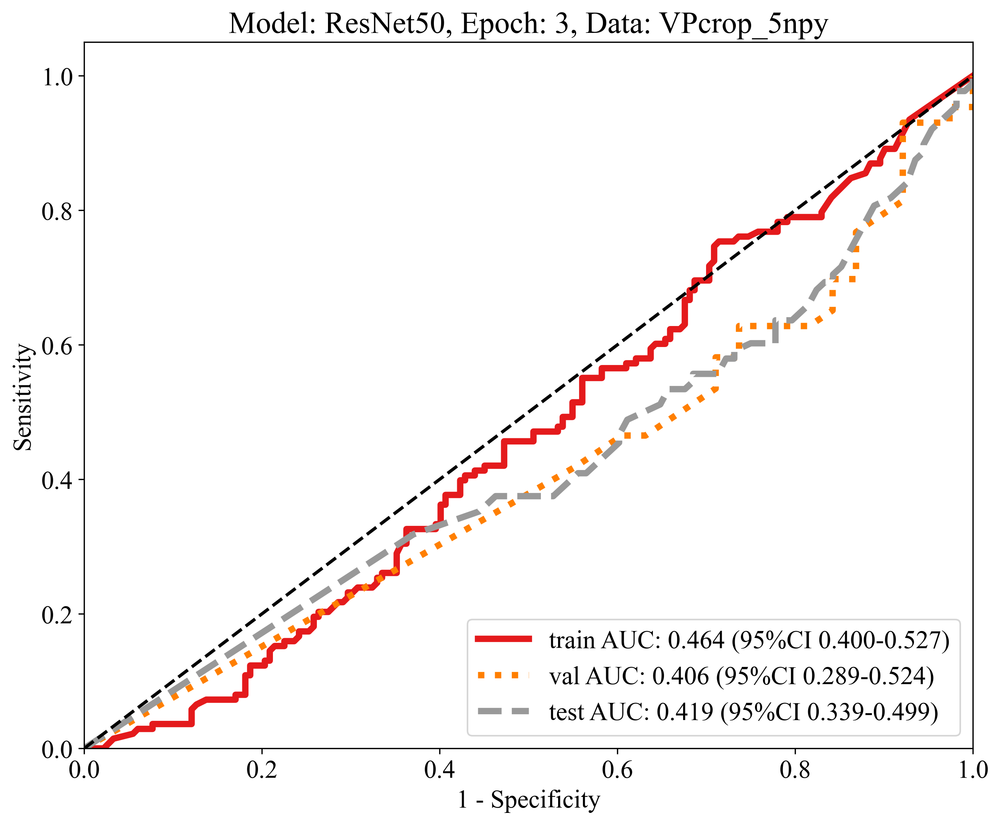

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.487,0.464,0.4004-0.5270,0.754,0.286,0.444,0.605,0.444,0.754,0.559,0.033,train,3
1,resnet50,0.531,0.406,0.2891-0.5236,0.930,0.079,0.533,0.500,0.533,0.930,0.678,0.943,val,3
2,resnet50,0.449,0.419,0.3388-0.4985,1.000,0.000,0.449,0.000,0.449,1.000,0.620,0.935,test,3


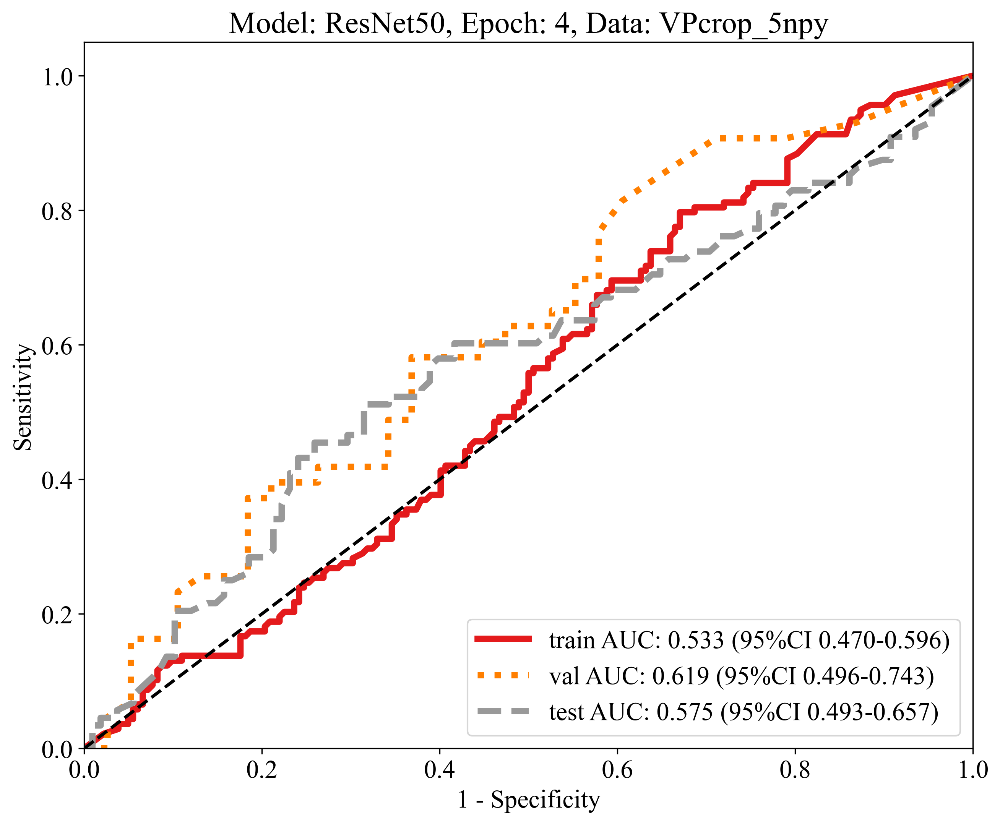

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.531,0.533,0.4696-0.5961,0.797,0.330,0.474,0.682,0.474,0.797,0.595,0.083,train,4
1,resnet50,0.605,0.619,0.4957-0.7430,0.581,0.632,0.641,0.571,0.641,0.581,0.610,0.119,val,4
2,resnet50,0.607,0.575,0.4926-0.6567,0.511,0.685,0.570,0.632,0.570,0.511,0.539,0.234,test,4


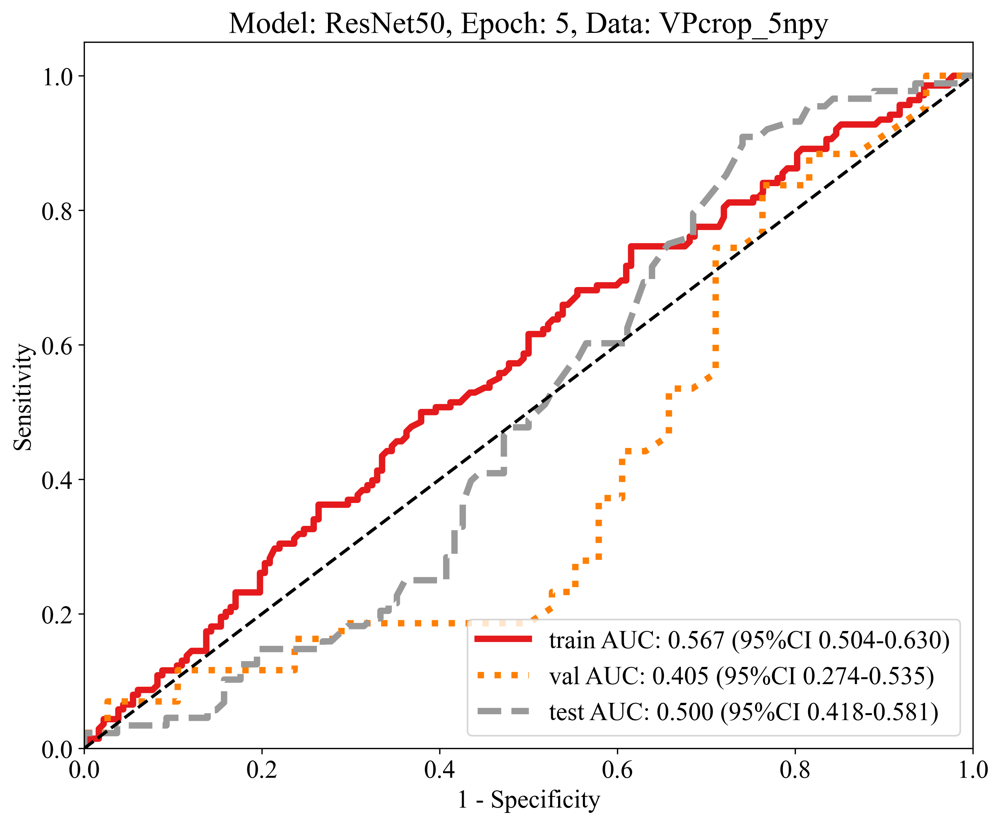

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.541,0.567,0.5038-0.6301,0.746,0.385,0.479,0.667,0.479,0.746,0.584,0.263,train,5
1,resnet50,0.556,0.405,0.2744-0.5353,0.837,0.237,0.554,0.562,0.554,0.837,0.667,0.593,val,5
2,resnet50,0.551,0.500,0.4182-0.5813,0.909,0.259,0.500,0.778,0.500,0.909,0.645,0.591,test,5


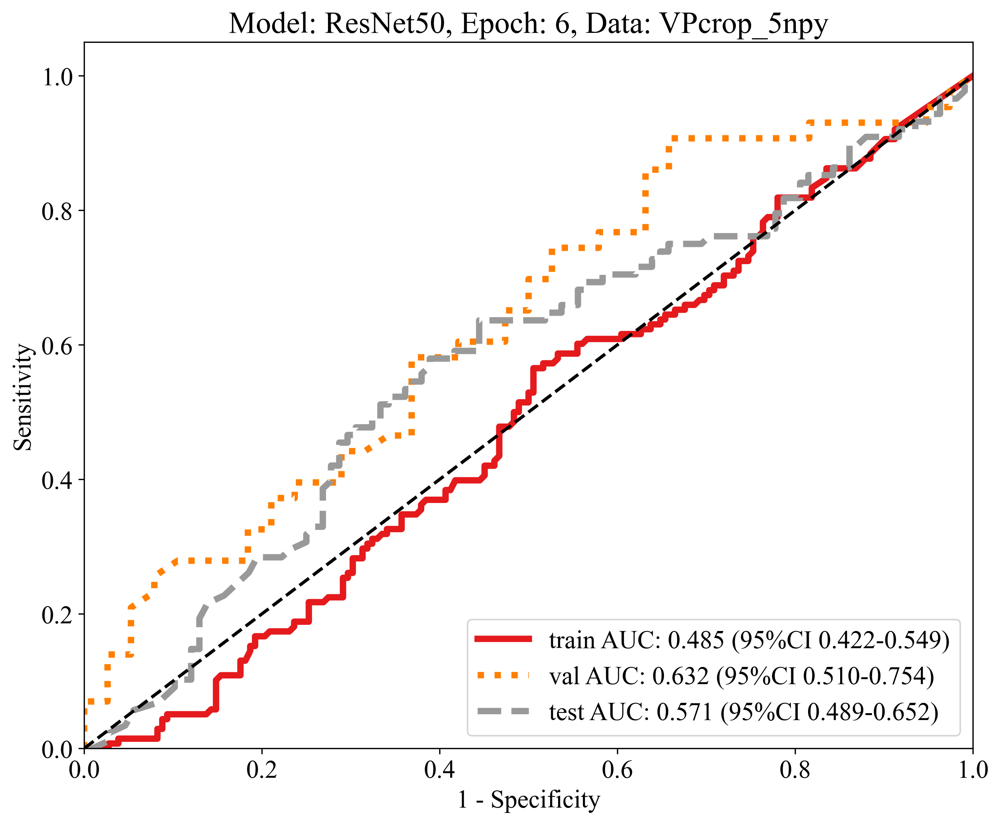

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.525,0.485,0.4216-0.5487,0.565,0.495,0.459,0.600,0.459,0.565,0.506,0.430,train,6
1,resnet50,0.642,0.632,0.5101-0.7543,0.907,0.342,0.609,0.765,0.609,0.907,0.729,0.064,val,6
2,resnet50,0.592,0.571,0.4890-0.6524,0.636,0.556,0.538,0.652,0.538,0.636,0.583,0.399,test,6


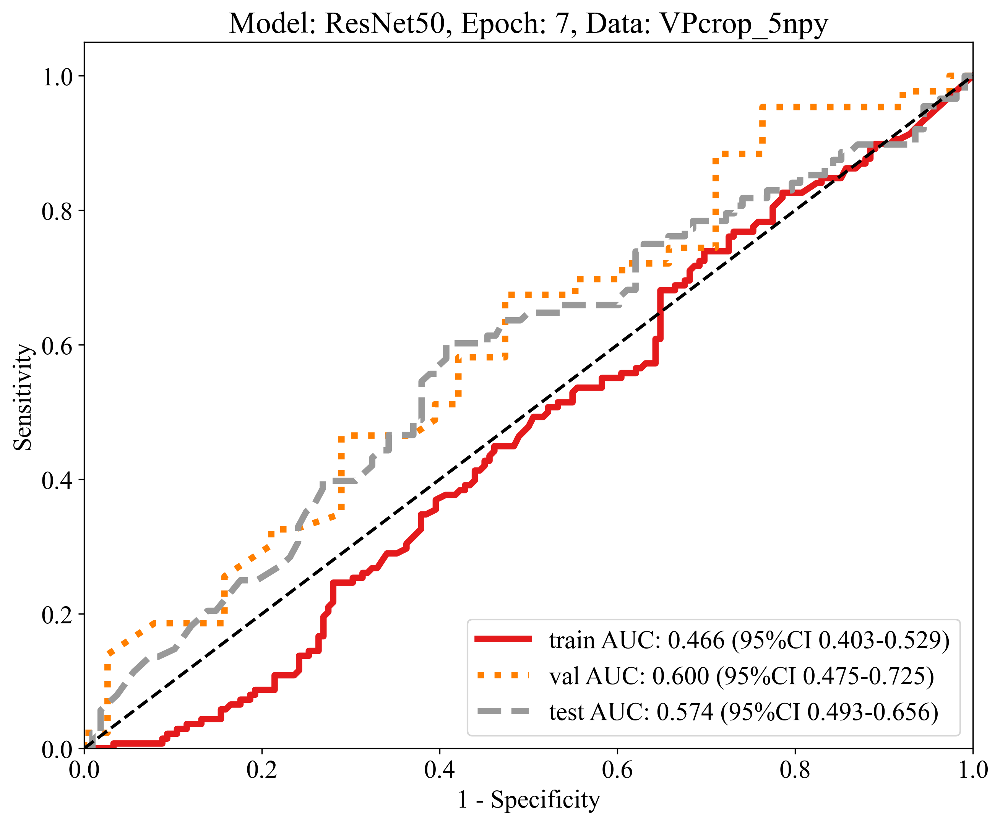

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.491,0.466,0.4032-0.5295,0.739,0.302,0.445,0.604,0.445,0.739,0.556,0.189,train,7
1,resnet50,0.605,0.600,0.4754-0.7247,0.674,0.526,0.617,0.588,0.617,0.674,0.644,0.538,val,7
2,resnet50,0.597,0.574,0.4933-0.6557,0.602,0.593,0.546,0.646,0.546,0.602,0.573,0.599,test,7


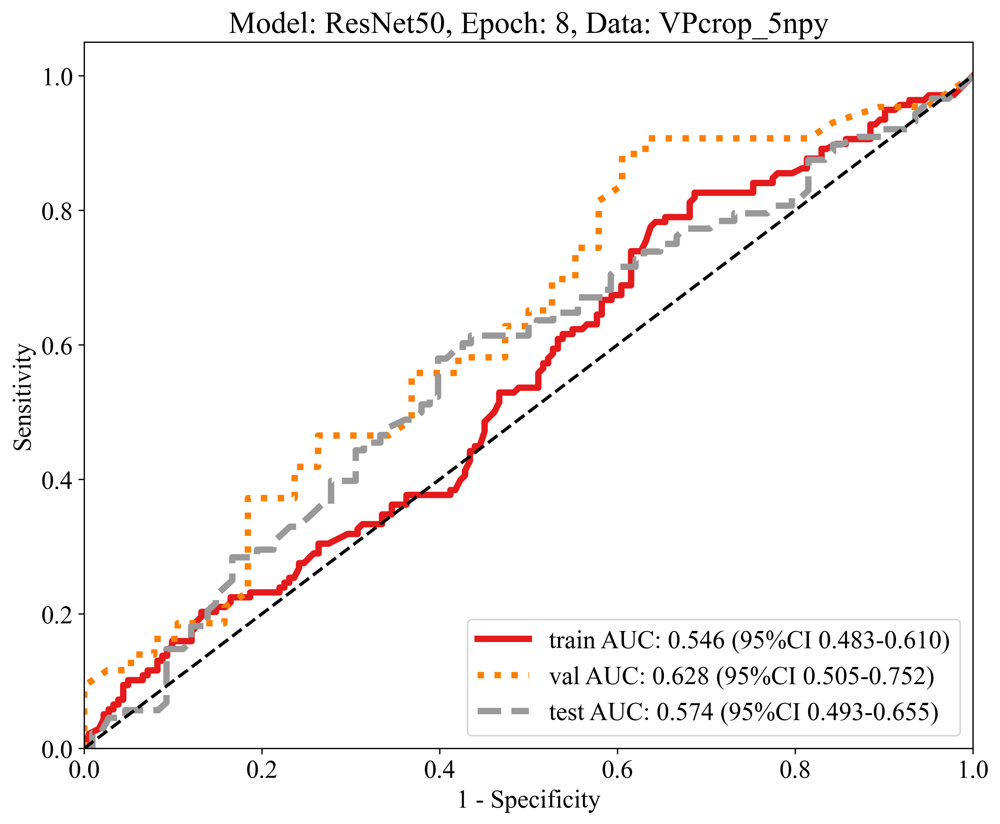

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.541,0.546,0.4827-0.6098,0.783,0.357,0.480,0.684,0.480,0.783,0.595,0.197,train,8
1,resnet50,0.654,0.628,0.5049-0.7515,0.884,0.395,0.623,0.750,0.623,0.884,0.731,0.025,val,8
2,resnet50,0.592,0.574,0.4928-0.6550,0.580,0.602,0.543,0.637,0.543,0.580,0.560,0.274,test,8


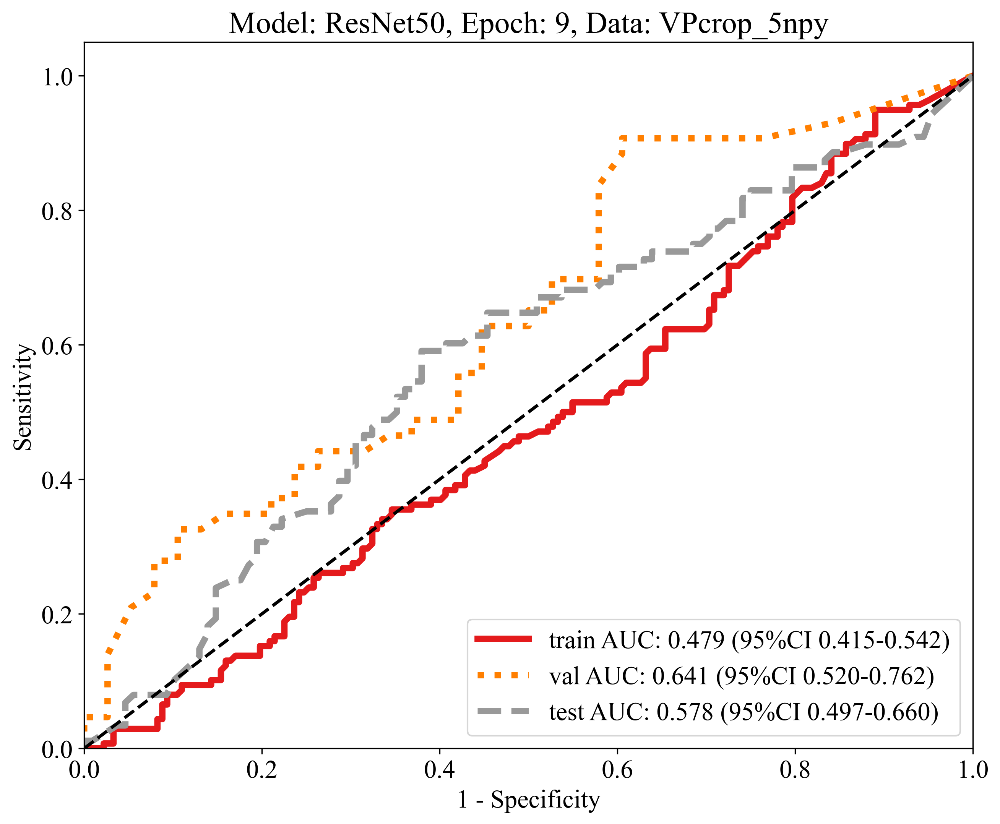

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.472,0.479,0.4149-0.5424,0.949,0.110,0.447,0.741,0.447,0.949,0.608,0.015,train,9
1,resnet50,0.667,0.641,0.5197-0.7625,0.907,0.395,0.629,0.789,0.629,0.907,0.743,0.008,val,9
2,resnet50,0.607,0.578,0.4972-0.6598,0.591,0.620,0.559,0.650,0.559,0.591,0.575,0.294,test,9


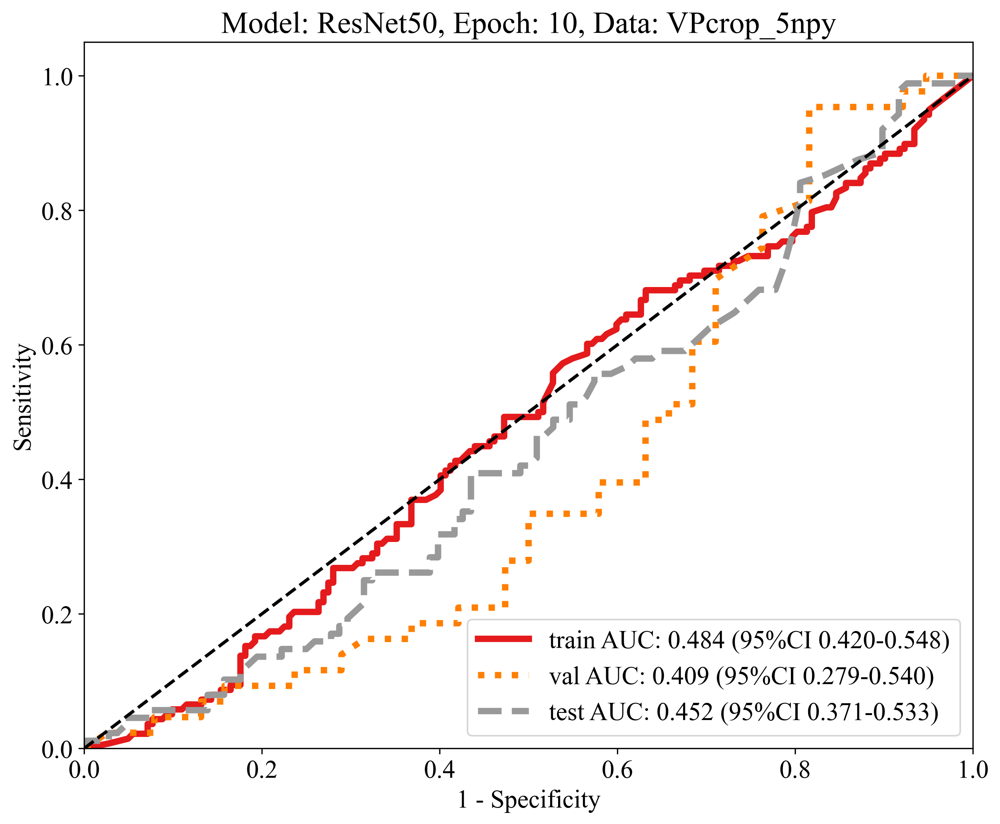

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.503,0.484,0.4205-0.5481,0.681,0.368,0.450,0.604,0.450,0.681,0.542,0.324,train,10
1,resnet50,0.593,0.409,0.2793-0.5395,0.953,0.184,0.569,0.778,0.569,0.953,0.713,0.502,val,10
2,resnet50,0.485,0.452,0.3714-0.5333,0.989,0.074,0.465,0.889,0.465,0.989,0.633,0.493,test,10


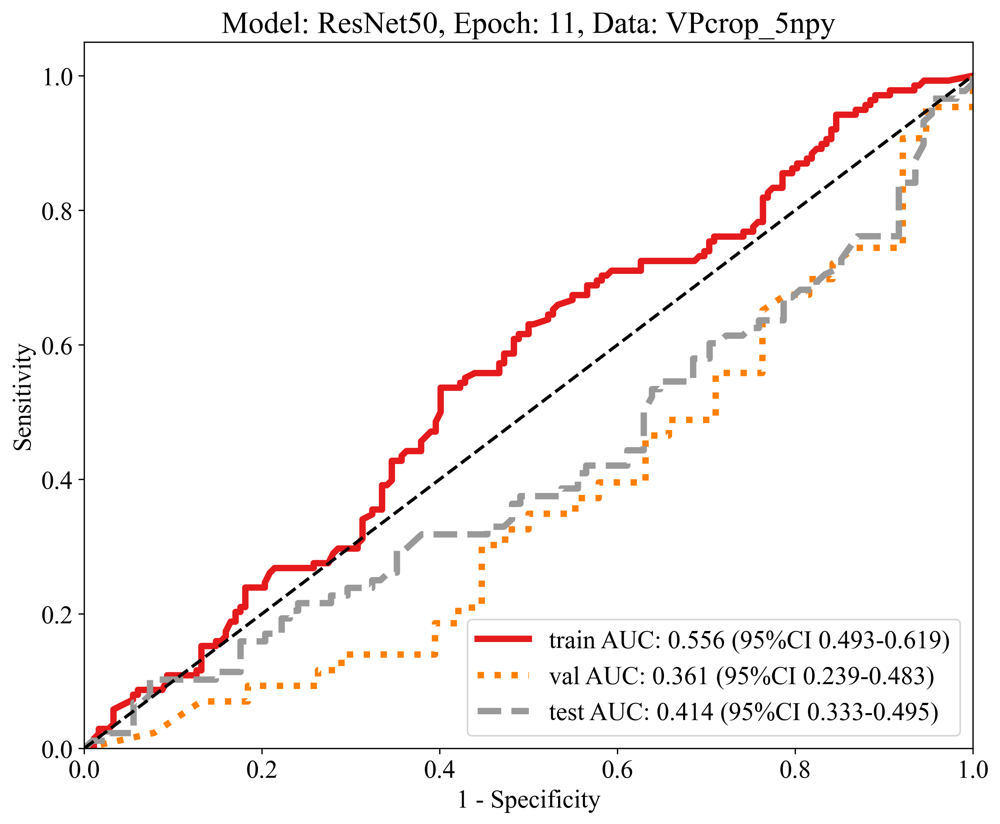

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.572,0.556,0.4927-0.6192,0.536,0.599,0.503,0.630,0.503,0.536,0.519,0.502,train,11
1,resnet50,0.531,0.361,0.2393-0.4834,0.953,0.053,0.532,0.500,0.532,0.953,0.683,0.524,val,11
2,resnet50,0.556,0.414,0.3330-0.4954,0.102,0.926,0.529,0.559,0.529,0.102,0.171,0.974,test,11


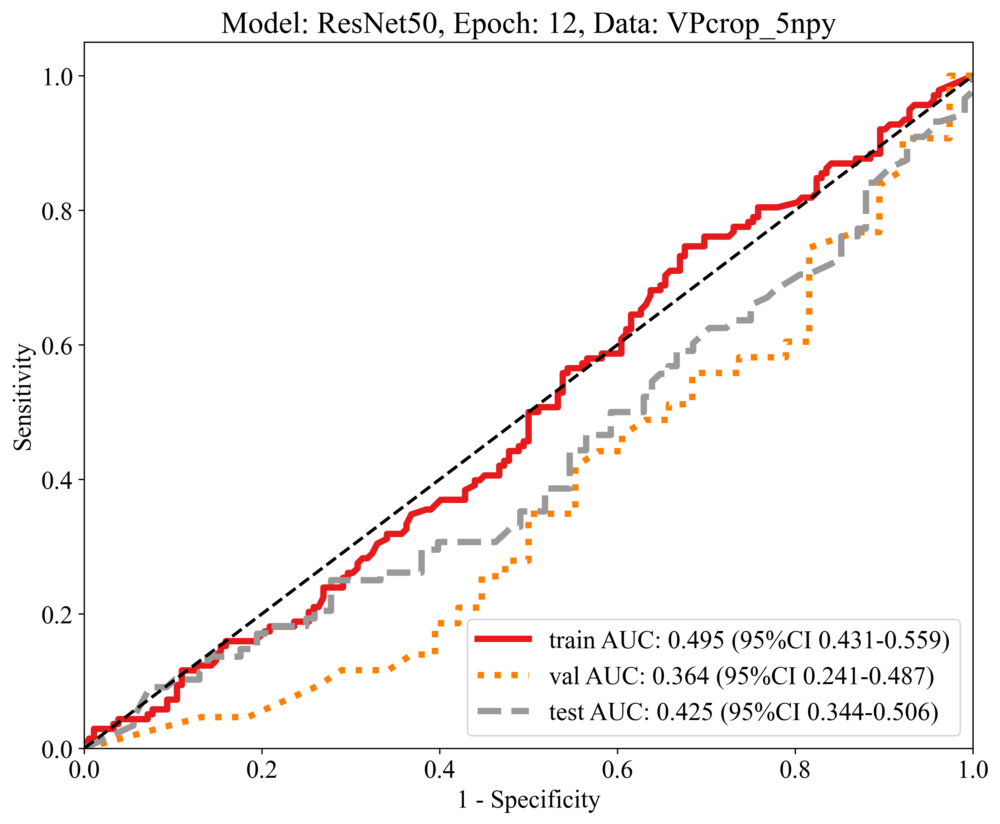

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.506,0.495,0.4313-0.5587,0.746,0.324,0.456,0.628,0.456,0.746,0.566,0.212,train,12
1,resnet50,0.543,0.364,0.2411-0.4865,1.000,0.026,0.537,1.000,0.537,1.000,0.699,0.708,val,12
2,resnet50,0.551,0.425,0.3440-0.5063,0.091,0.926,0.500,0.556,0.500,0.091,0.154,0.997,test,12


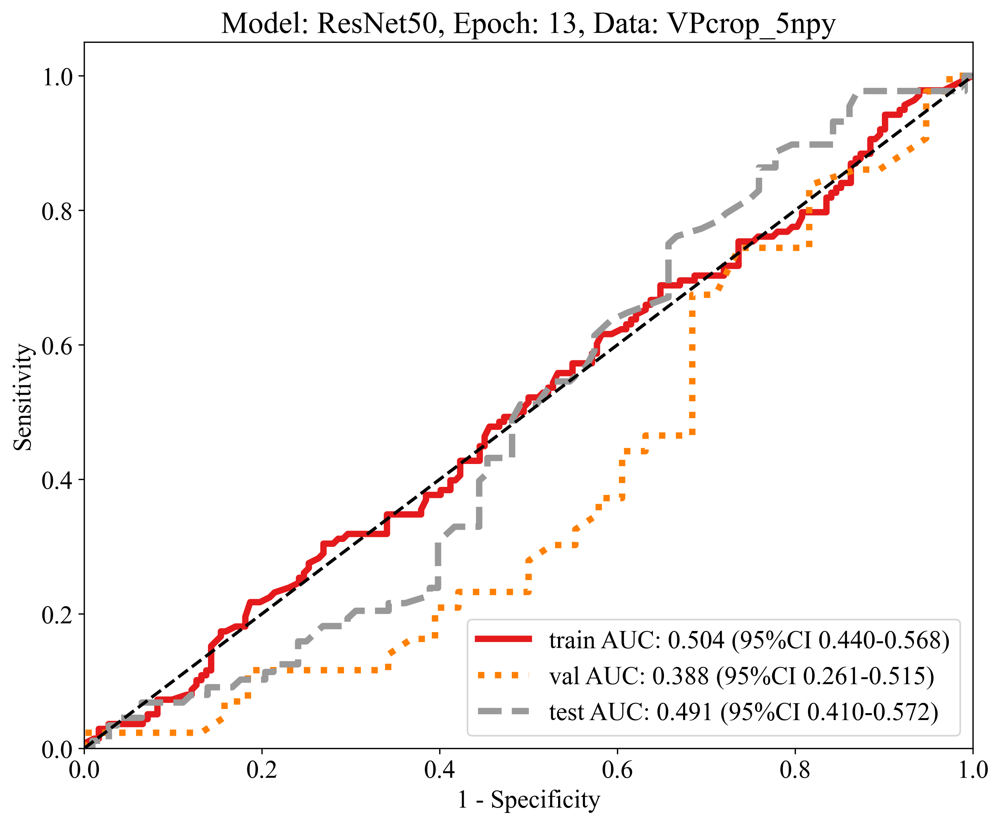

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.463,0.504,0.4398-0.5678,0.942,0.099,0.442,0.692,0.442,0.942,0.602,0.031,train,13
1,resnet50,0.543,0.388,0.2607-0.5147,0.977,0.053,0.538,0.667,0.538,0.977,0.694,0.373,val,13
2,resnet50,0.520,0.491,0.4096-0.5724,0.886,0.222,0.481,0.706,0.481,0.886,0.624,0.417,test,13


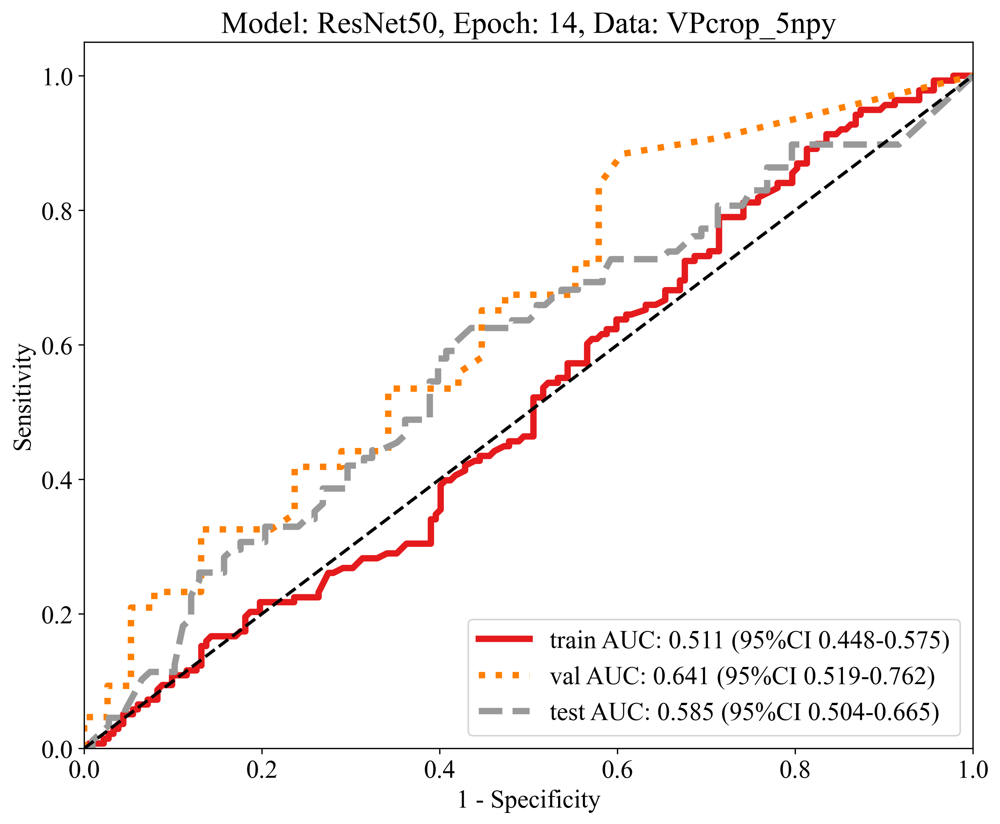

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.491,0.511,0.4476-0.5747,0.891,0.187,0.454,0.694,0.454,0.891,0.601,0.231,train,14
1,resnet50,0.654,0.641,0.5194-0.7621,0.884,0.395,0.623,0.750,0.623,0.884,0.731,0.004,val,14
2,resnet50,0.592,0.585,0.5038-0.6655,0.625,0.565,0.539,0.649,0.539,0.625,0.579,0.131,test,14


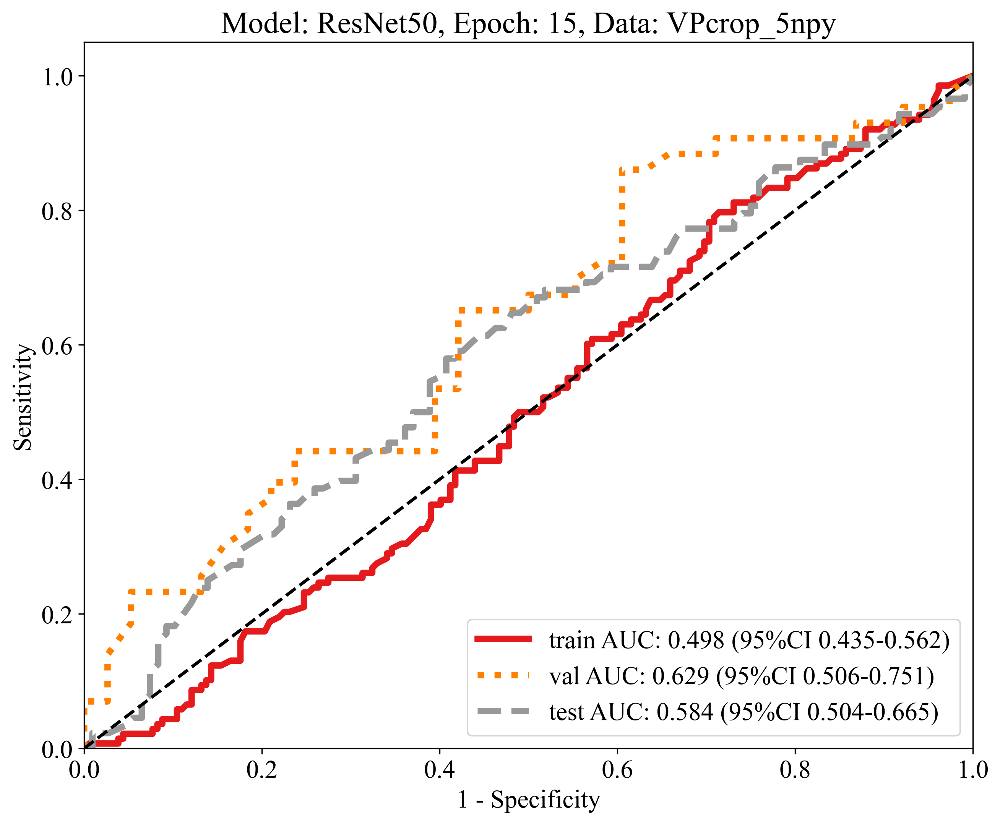

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.506,0.498,0.4346-0.5615,0.797,0.286,0.458,0.650,0.458,0.797,0.582,0.266,train,15
1,resnet50,0.642,0.629,0.5064-0.7513,0.860,0.395,0.617,0.714,0.617,0.860,0.718,0.086,val,15
2,resnet50,0.587,0.584,0.5036-0.6653,0.591,0.583,0.536,0.636,0.536,0.591,0.562,0.286,test,15


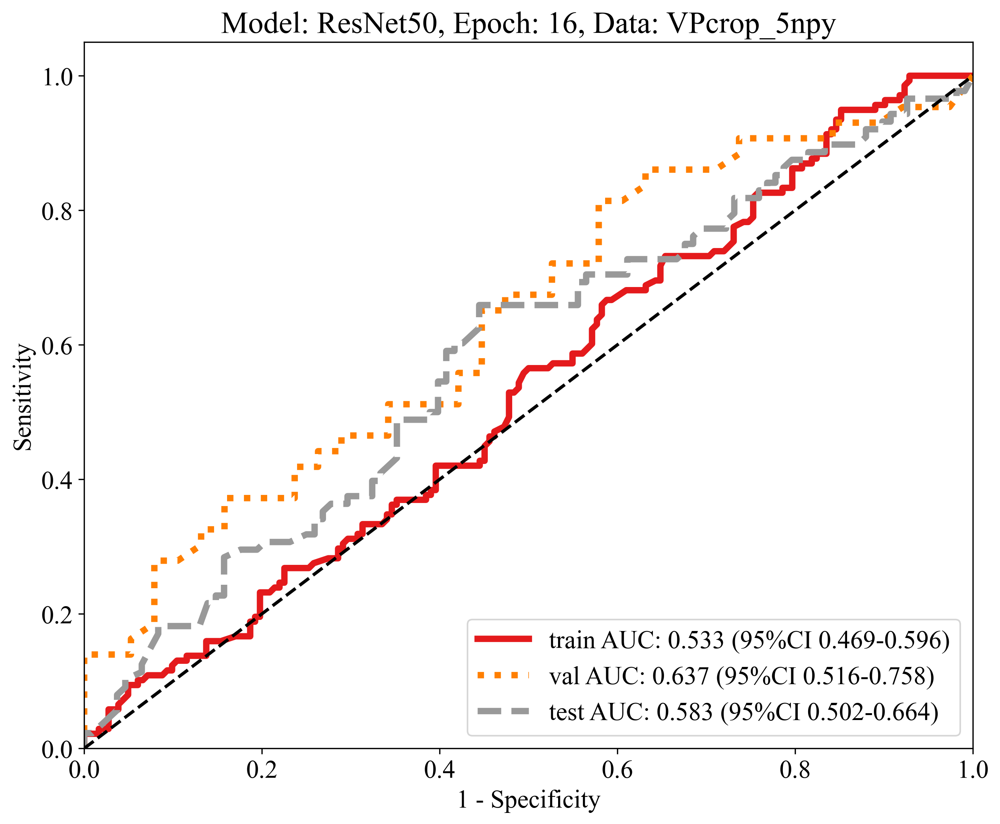

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.494,0.533,0.4691-0.5960,0.949,0.148,0.458,0.794,0.458,0.949,0.618,0.197,train,16
1,resnet50,0.630,0.637,0.5155-0.7580,0.814,0.421,0.614,0.667,0.614,0.814,0.700,0.127,val,16
2,resnet50,0.602,0.583,0.5023-0.6637,0.659,0.556,0.547,0.667,0.547,0.659,0.598,0.344,test,16


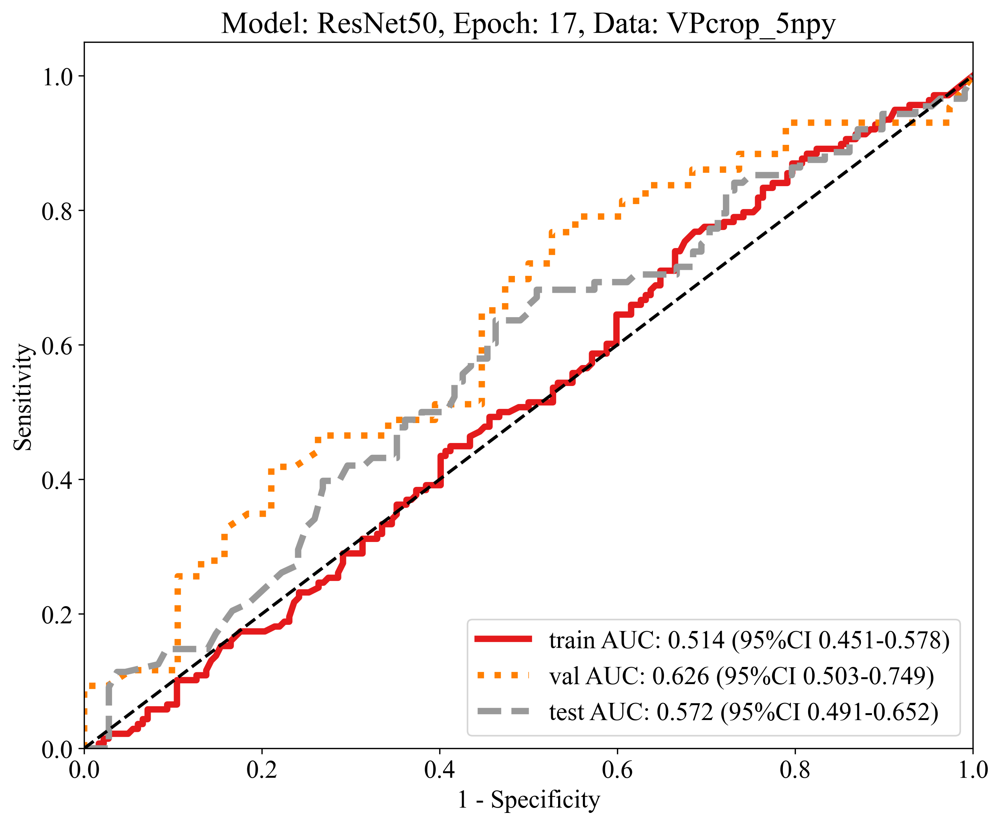

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.509,0.514,0.4509-0.5779,0.768,0.313,0.459,0.640,0.459,0.768,0.575,0.270,train,17
1,resnet50,0.630,0.626,0.5025-0.7490,0.767,0.474,0.623,0.643,0.623,0.767,0.687,0.306,val,17
2,resnet50,0.582,0.572,0.4906-0.6525,0.636,0.537,0.528,0.644,0.528,0.636,0.577,0.442,test,17


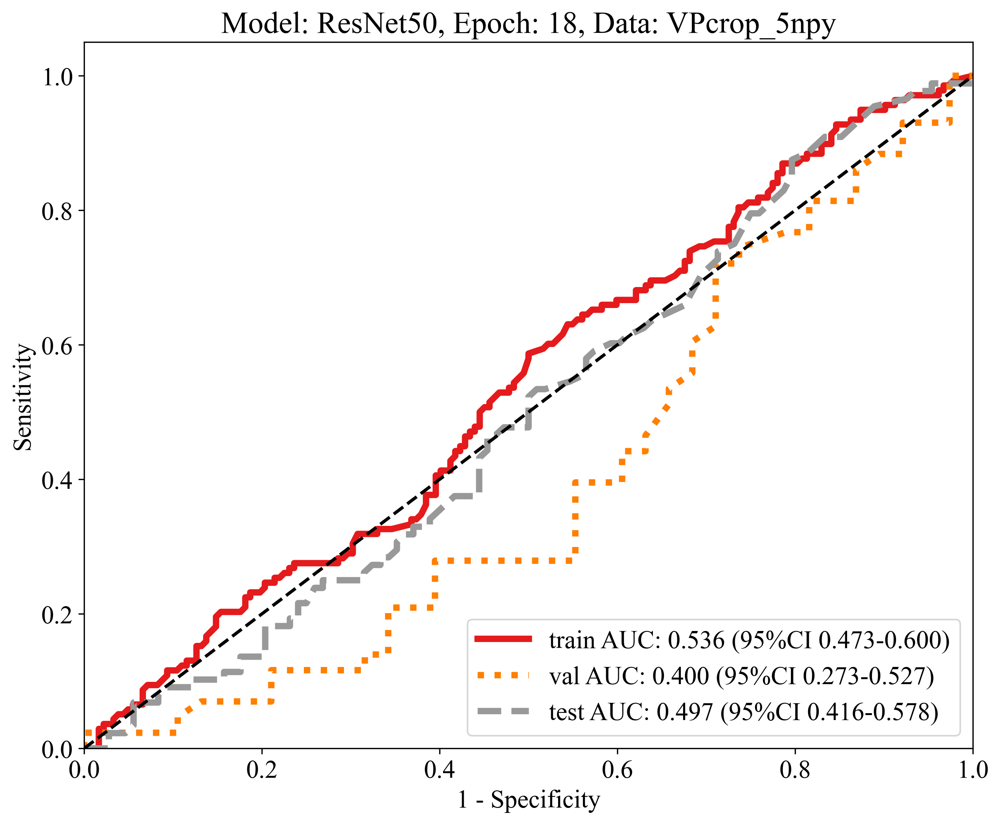

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.537,0.536,0.4726-0.5996,0.587,0.500,0.471,0.615,0.471,0.587,0.523,0.402,train,18
1,resnet50,0.543,0.400,0.2727-0.5266,1.000,0.026,0.537,1.000,0.537,1.000,0.699,0.660,val,18
2,resnet50,0.505,0.497,0.4161-0.5785,0.875,0.204,0.472,0.667,0.472,0.875,0.614,0.673,test,18


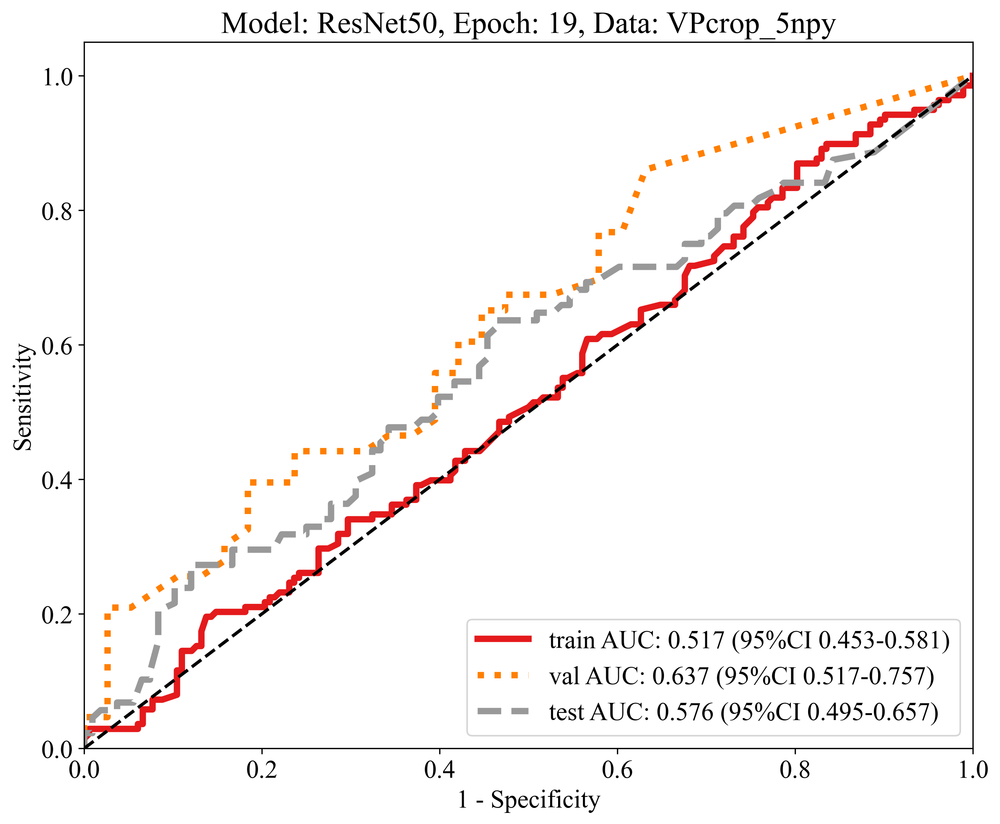

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.487,0.517,0.4532-0.5810,0.870,0.198,0.451,0.667,0.451,0.870,0.594,0.403,train,19
1,resnet50,0.630,0.637,0.5167-0.7575,0.860,0.368,0.607,0.700,0.607,0.860,0.712,0.001,val,19
2,resnet50,0.582,0.576,0.4950-0.6575,0.636,0.537,0.528,0.644,0.528,0.636,0.577,0.067,test,19


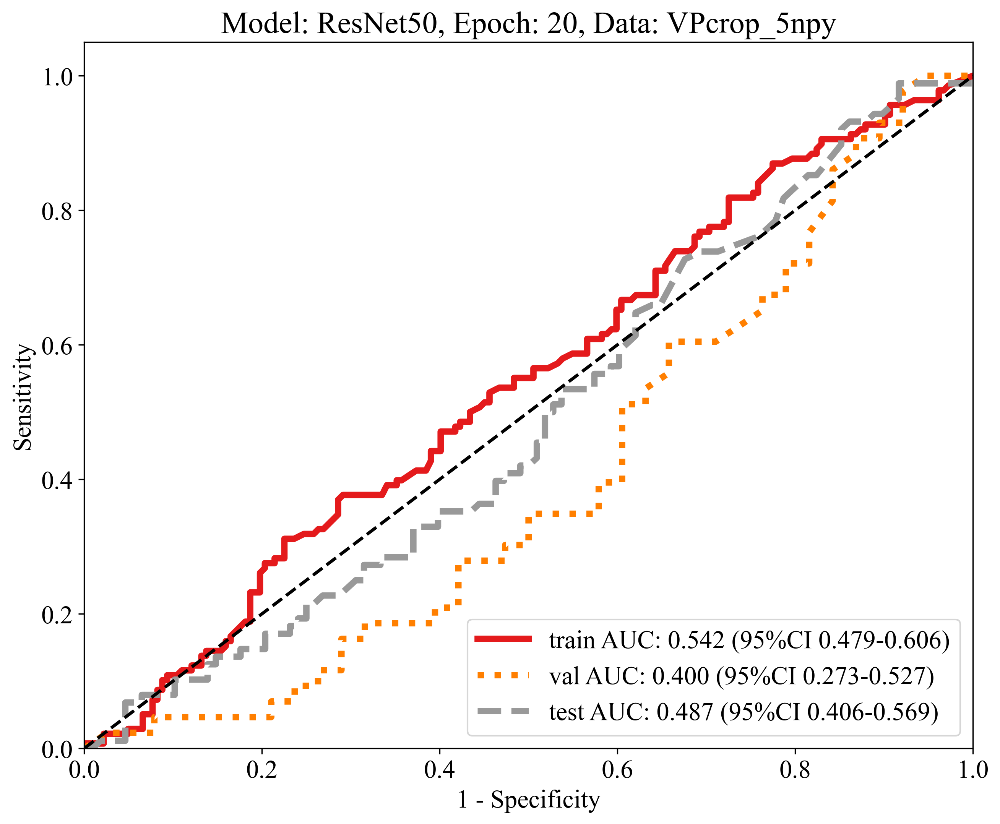

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.503,0.542,0.4788-0.6058,0.870,0.225,0.460,0.695,0.460,0.870,0.602,0.162,train,20
1,resnet50,0.556,0.400,0.2731-0.5274,0.977,0.079,0.545,0.750,0.545,0.977,0.700,0.555,val,20
2,resnet50,0.490,0.487,0.4062-0.5688,0.989,0.083,0.468,0.900,0.468,0.989,0.635,0.548,test,20


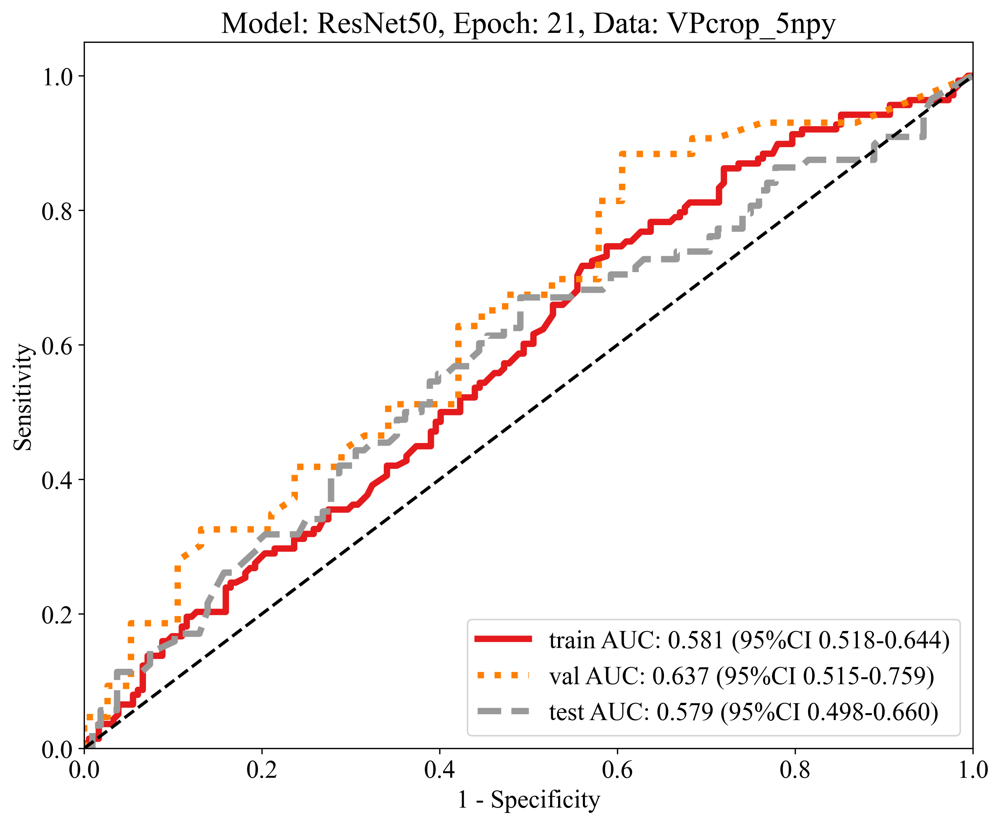

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.556,0.581,0.5184-0.6437,0.746,0.412,0.490,0.682,0.490,0.746,0.592,0.432,train,21
1,resnet50,0.654,0.637,0.5151-0.7590,0.884,0.395,0.623,0.750,0.623,0.884,0.731,0.014,val,21
2,resnet50,0.582,0.579,0.4978-0.6600,0.670,0.509,0.527,0.655,0.527,0.670,0.590,0.176,test,21


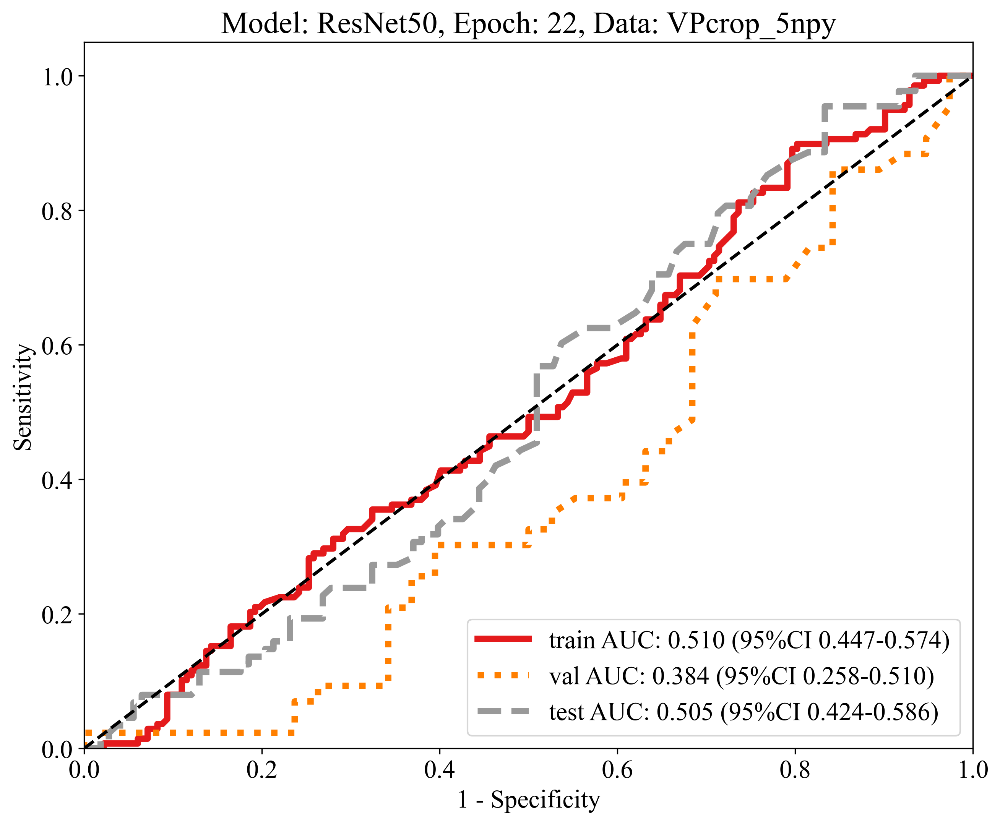

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.500,0.510,0.4465-0.5737,0.899,0.198,0.459,0.720,0.459,0.899,0.608,0.202,train,22
1,resnet50,0.543,0.384,0.2584-0.5097,1.000,0.026,0.537,1.000,0.537,1.000,0.699,0.508,val,22
2,resnet50,0.520,0.505,0.4237-0.5862,0.955,0.167,0.483,0.818,0.483,0.955,0.641,0.542,test,22


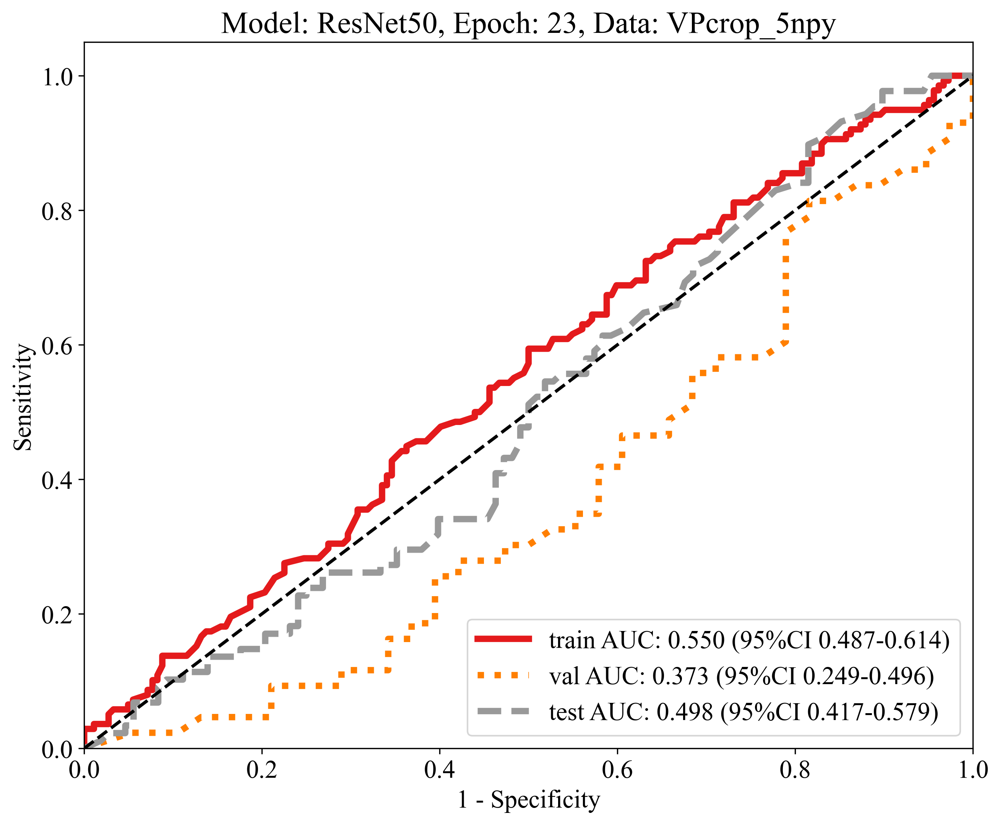

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.541,0.550,0.4868-0.6135,0.594,0.500,0.474,0.619,0.474,0.594,0.527,0.467,train,23
1,resnet50,0.531,0.373,0.2491-0.4963,1.000,0.000,0.531,0.000,0.531,1.000,0.694,0.540,val,23
2,resnet50,0.505,0.498,0.4165-0.5791,0.898,0.185,0.473,0.690,0.473,0.898,0.620,0.549,test,23


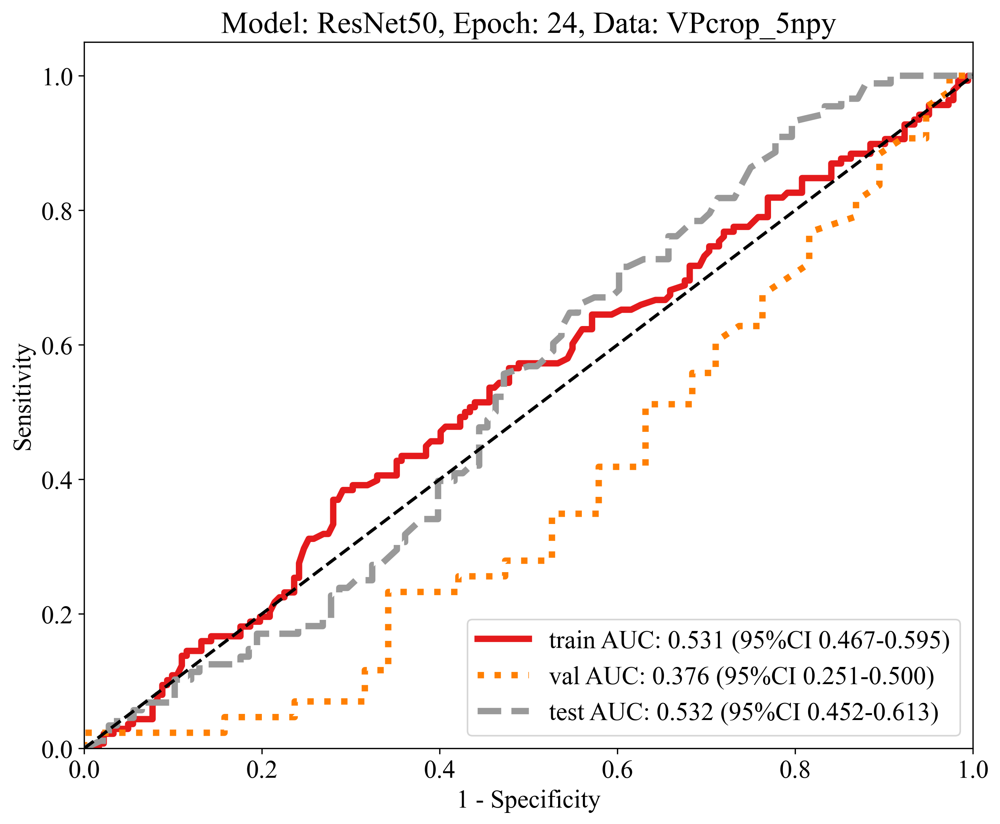

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.569,0.531,0.4668-0.5948,0.384,0.709,0.500,0.603,0.500,0.384,0.434,0.504,train,24
1,resnet50,0.543,0.376,0.2511-0.5004,1.000,0.026,0.537,1.000,0.537,1.000,0.699,0.497,val,24
2,resnet50,0.531,0.532,0.4516-0.6134,0.932,0.204,0.488,0.786,0.488,0.932,0.641,0.513,test,24


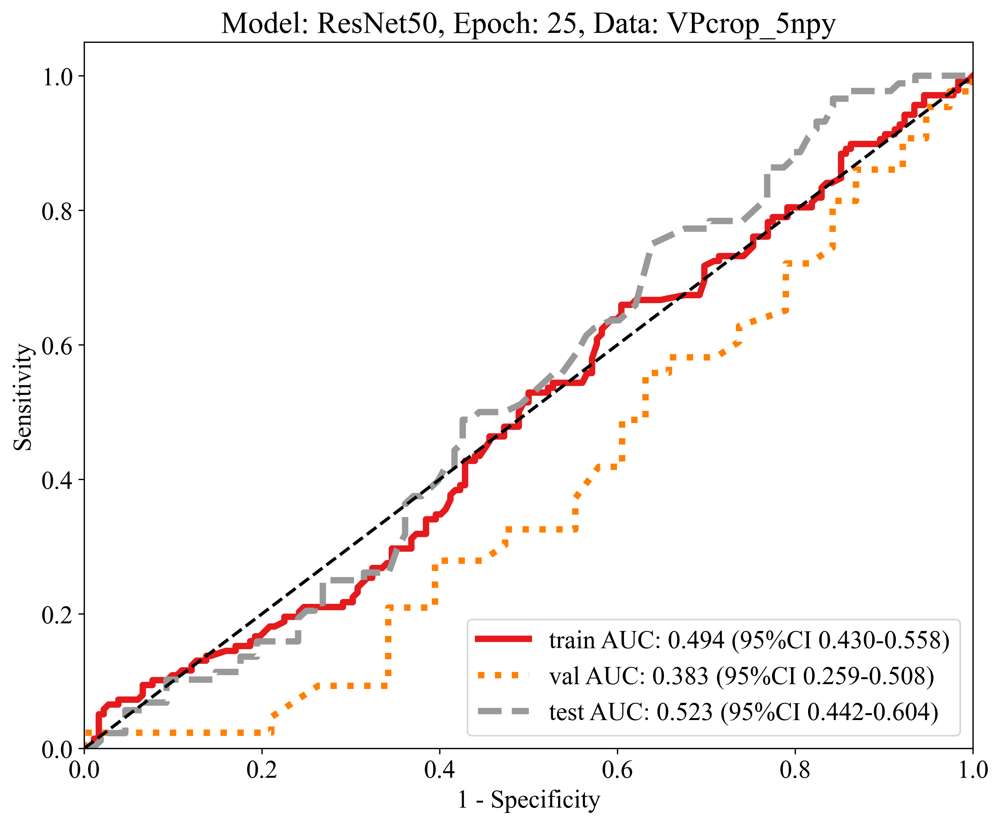

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.509,0.494,0.4298-0.5576,0.659,0.396,0.453,0.605,0.453,0.659,0.537,0.370,train,25
1,resnet50,0.481,0.383,0.2586-0.5083,0.023,1.000,1.000,0.475,1.000,0.023,0.045,1.000,val,25
2,resnet50,0.520,0.523,0.4418-0.6037,0.966,0.157,0.483,0.850,0.483,0.966,0.644,0.509,test,25


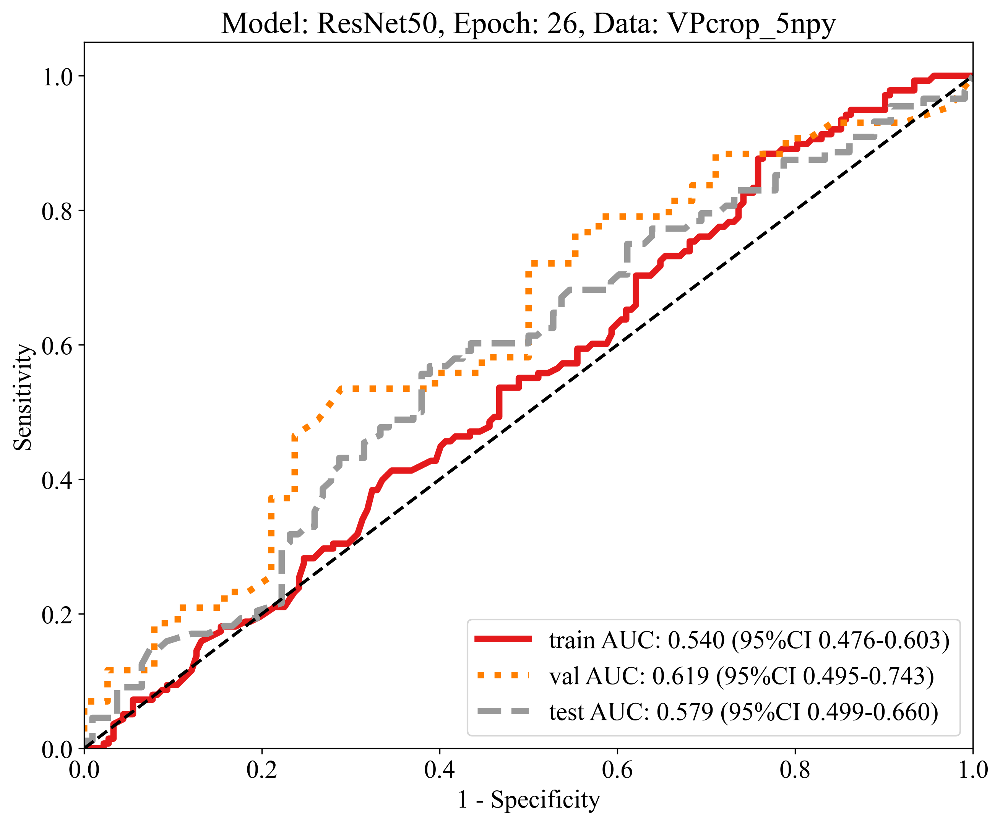

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.516,0.540,0.4764-0.6028,0.884,0.236,0.467,0.729,0.467,0.884,0.612,0.359,train,26
1,resnet50,0.617,0.619,0.4952-0.7429,0.535,0.711,0.676,0.574,0.676,0.535,0.597,0.415,val,26
2,resnet50,0.592,0.579,0.4985-0.6598,0.568,0.611,0.543,0.635,0.543,0.568,0.556,0.417,test,26


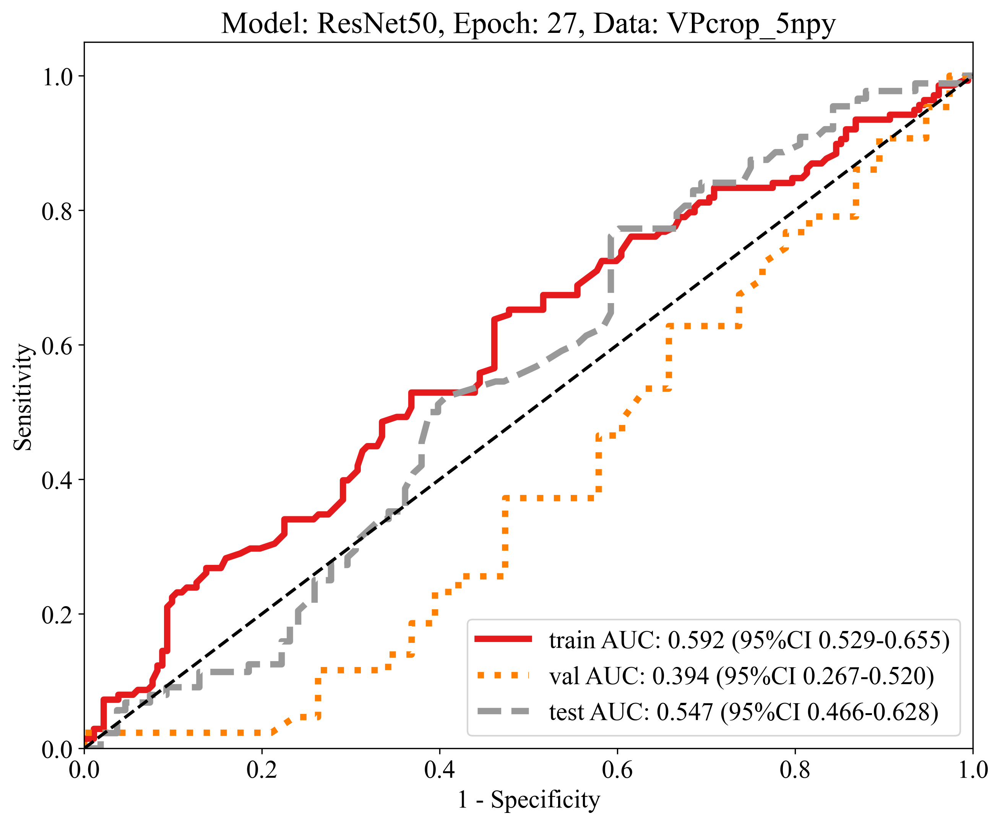

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.581,0.592,0.5286-0.6545,0.638,0.538,0.512,0.662,0.512,0.638,0.568,0.465,train,27
1,resnet50,0.543,0.394,0.2673-0.5203,1.000,0.026,0.537,1.000,0.537,1.000,0.699,0.249,val,27
2,resnet50,0.566,0.547,0.4663-0.6278,0.773,0.398,0.511,0.683,0.511,0.773,0.615,0.474,test,27


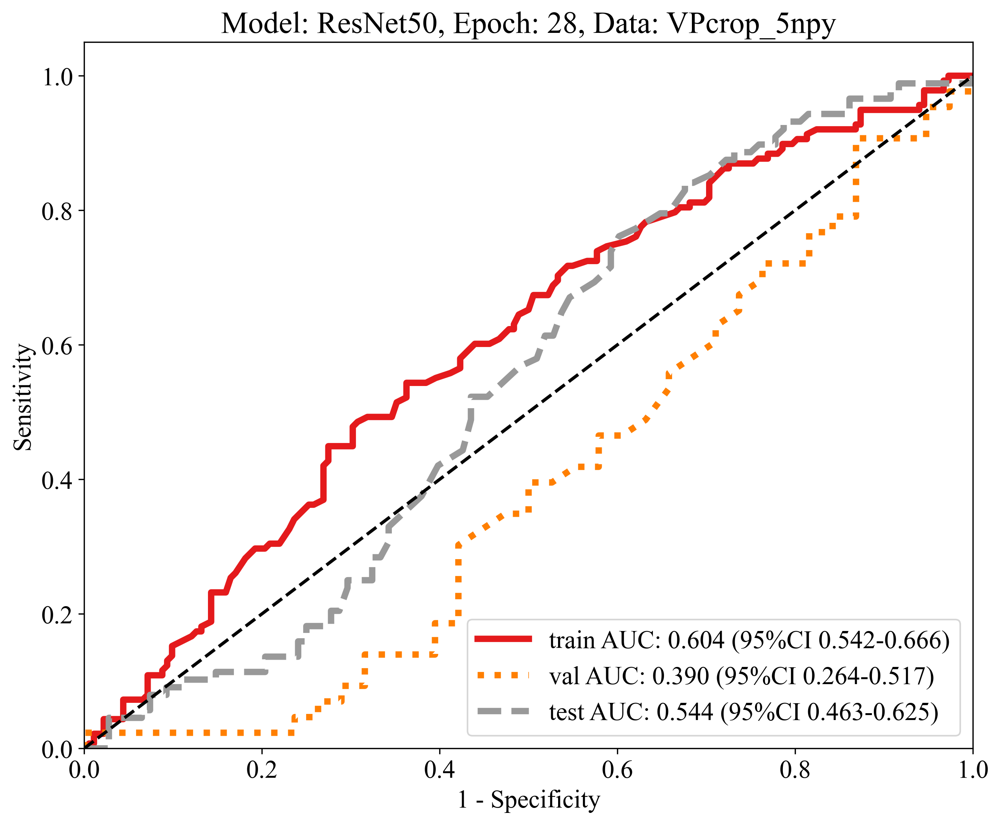

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.597,0.604,0.5418-0.6660,0.543,0.637,0.532,0.648,0.532,0.543,0.538,0.454,train,28
1,resnet50,0.543,0.390,0.2643-0.5166,0.907,0.132,0.542,0.556,0.542,0.907,0.678,0.394,val,28
2,resnet50,0.556,0.544,0.4631-0.6251,0.841,0.324,0.503,0.714,0.503,0.841,0.630,0.466,test,28


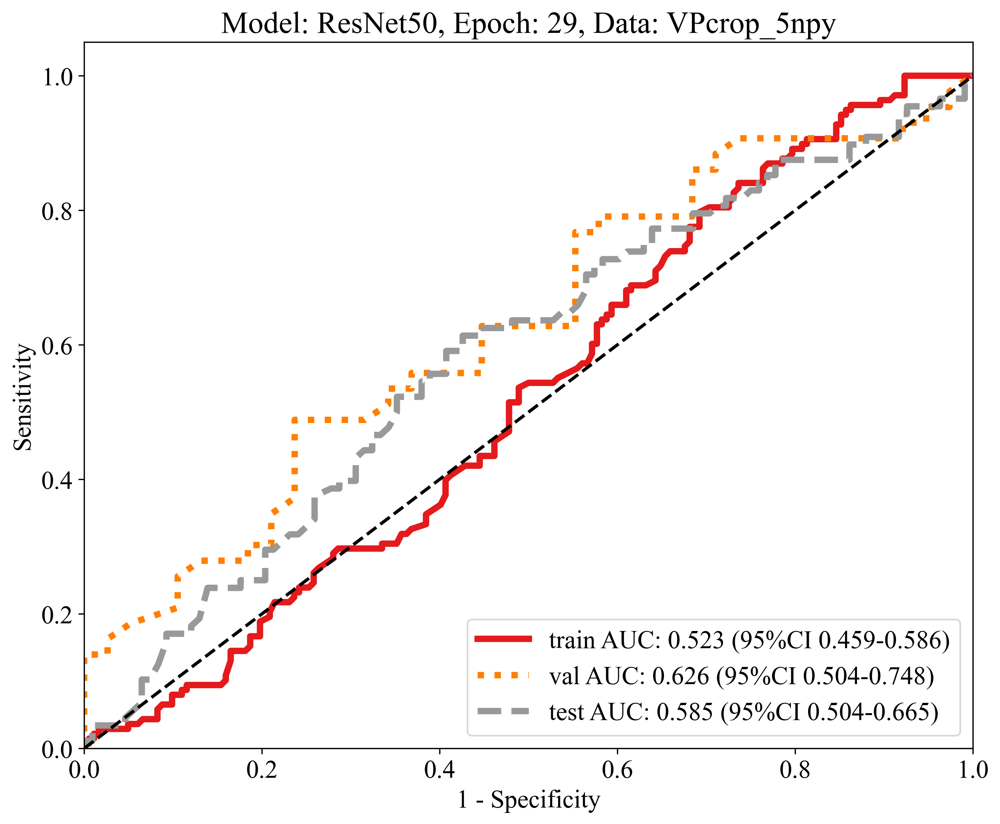

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.519,0.523,0.4594-0.5858,0.797,0.308,0.466,0.667,0.466,0.797,0.588,0.380,train,29
1,resnet50,0.617,0.626,0.5037-0.7484,0.488,0.763,0.700,0.569,0.700,0.488,0.575,0.360,val,29
2,resnet50,0.592,0.585,0.5041-0.6653,0.614,0.574,0.540,0.646,0.540,0.614,0.574,0.339,test,29


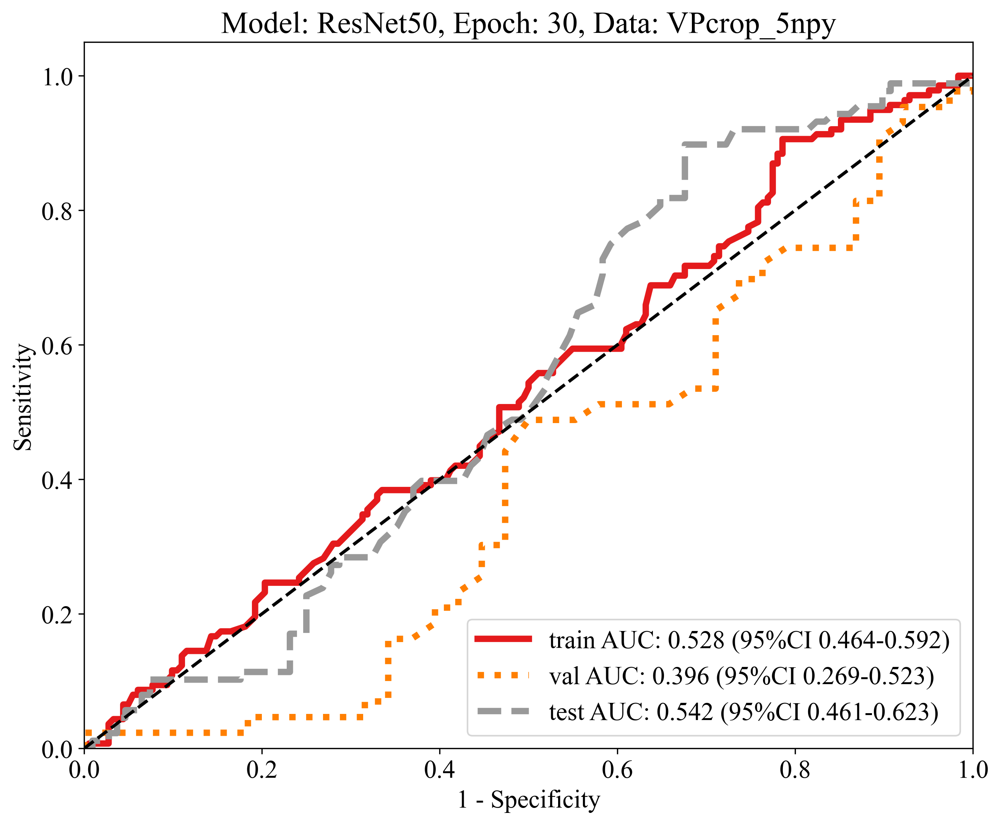

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.512,0.528,0.4644-0.5916,0.906,0.214,0.466,0.750,0.466,0.906,0.616,0.353,train,30
1,resnet50,0.543,0.396,0.2687-0.5226,0.953,0.079,0.539,0.600,0.539,0.953,0.689,0.405,val,30
2,resnet50,0.582,0.542,0.4611-0.6233,0.898,0.324,0.520,0.795,0.520,0.898,0.658,0.464,test,30


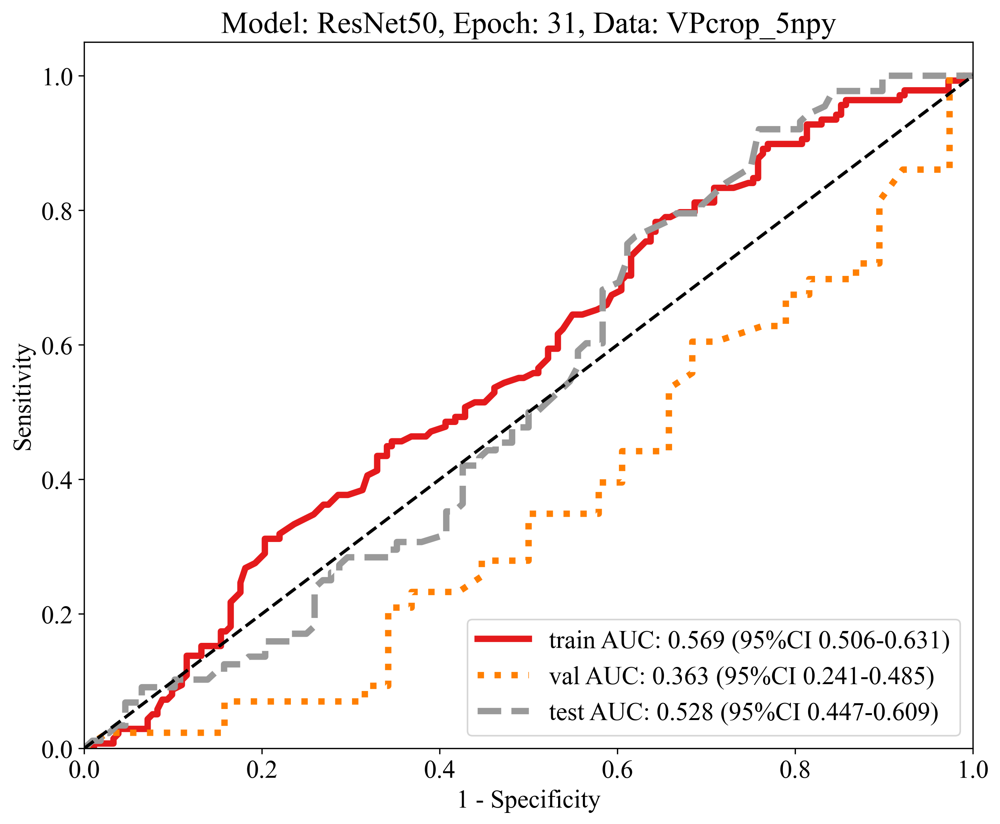

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.541,0.569,0.5059-0.6314,0.783,0.357,0.480,0.684,0.480,0.783,0.595,0.398,train,31
1,resnet50,0.543,0.363,0.2410-0.4854,1.000,0.026,0.537,1.000,0.537,1.000,0.699,0.491,val,31
2,resnet50,0.546,0.528,0.4469-0.6092,0.920,0.241,0.497,0.788,0.497,0.920,0.645,0.533,test,31


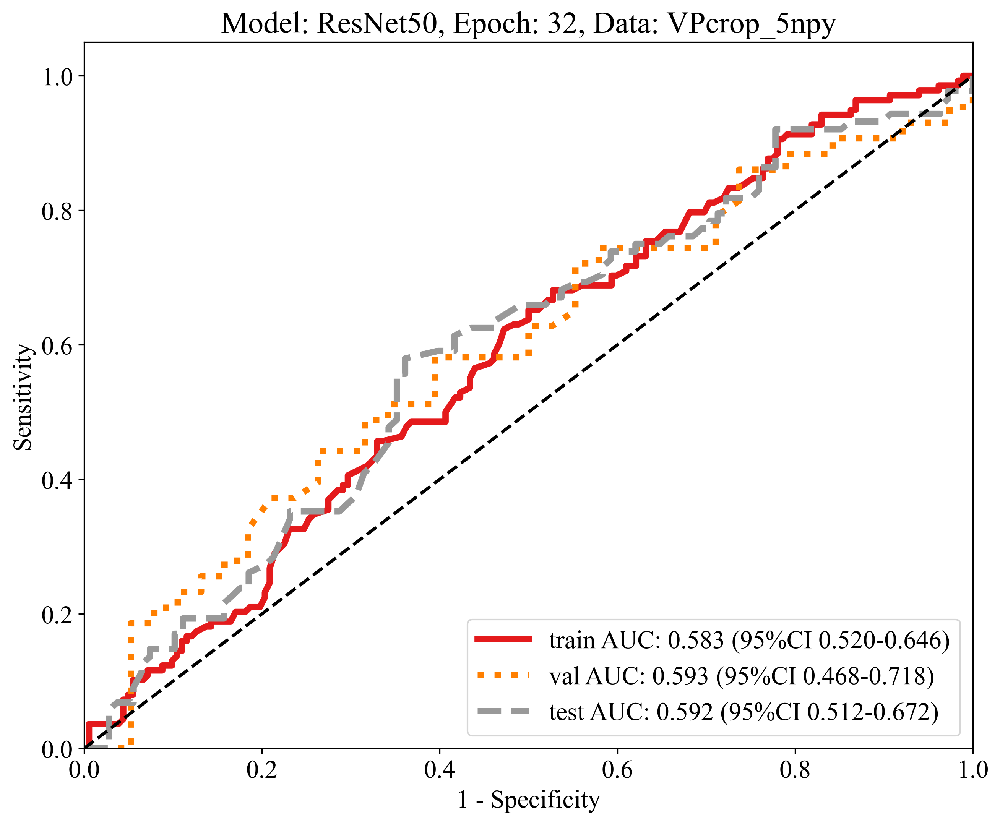

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.562,0.583,0.5205-0.6455,0.681,0.473,0.495,0.662,0.495,0.681,0.573,0.442,train,32
1,resnet50,0.593,0.593,0.4675-0.7179,0.581,0.605,0.625,0.561,0.625,0.581,0.602,0.421,val,32
2,resnet50,0.612,0.592,0.5116-0.6721,0.580,0.639,0.567,0.651,0.567,0.580,0.573,0.444,test,32


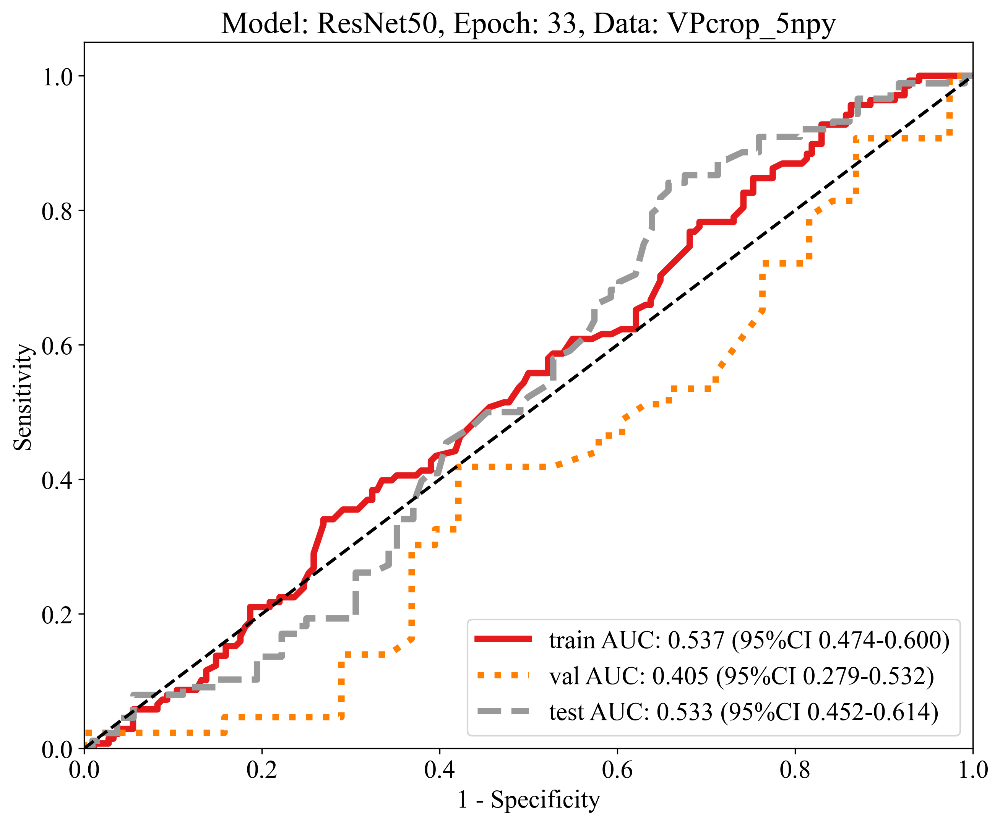

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.497,0.537,0.4736-0.6000,0.928,0.170,0.459,0.756,0.459,0.928,0.614,0.301,train,33
1,resnet50,0.543,0.405,0.2788-0.5321,0.907,0.132,0.542,0.556,0.542,0.907,0.678,0.379,val,33
2,resnet50,0.566,0.533,0.4518-0.6140,0.841,0.343,0.510,0.725,0.510,0.841,0.635,0.461,test,33


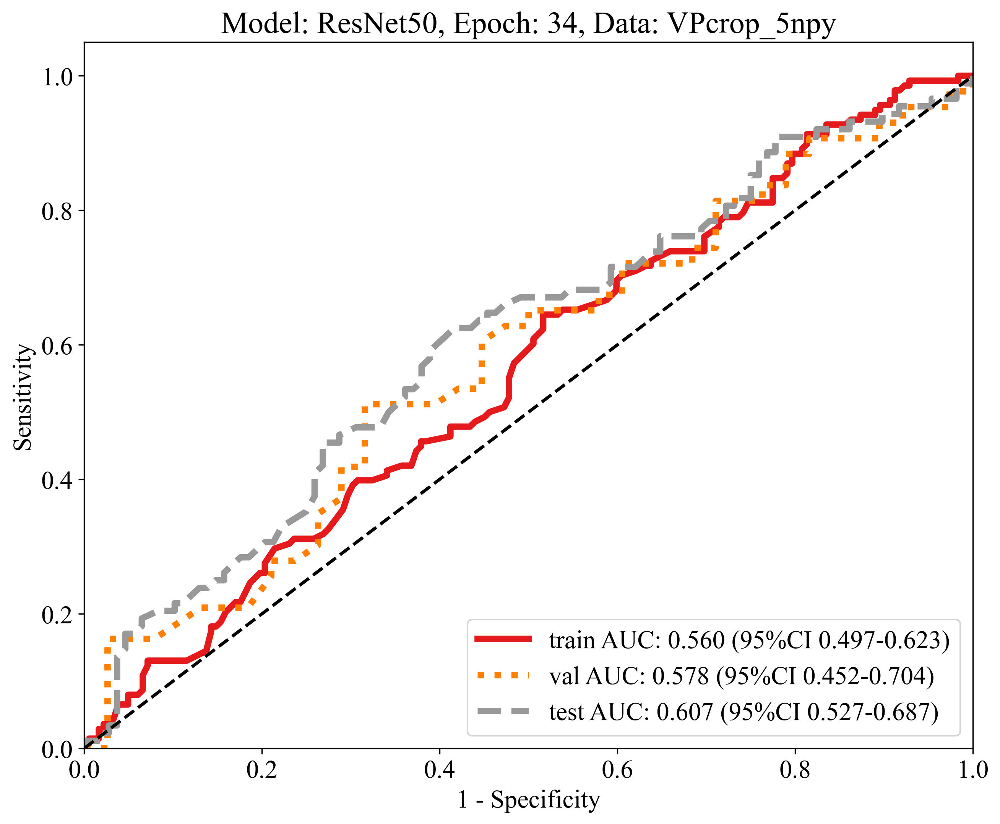

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.553,0.560,0.4972-0.6235,0.645,0.484,0.486,0.642,0.486,0.645,0.555,0.437,train,34
1,resnet50,0.593,0.578,0.4519-0.7036,0.512,0.684,0.647,0.553,0.647,0.512,0.571,0.416,val,34
2,resnet50,0.602,0.607,0.5272-0.6869,0.625,0.583,0.550,0.656,0.550,0.625,0.585,0.415,test,34


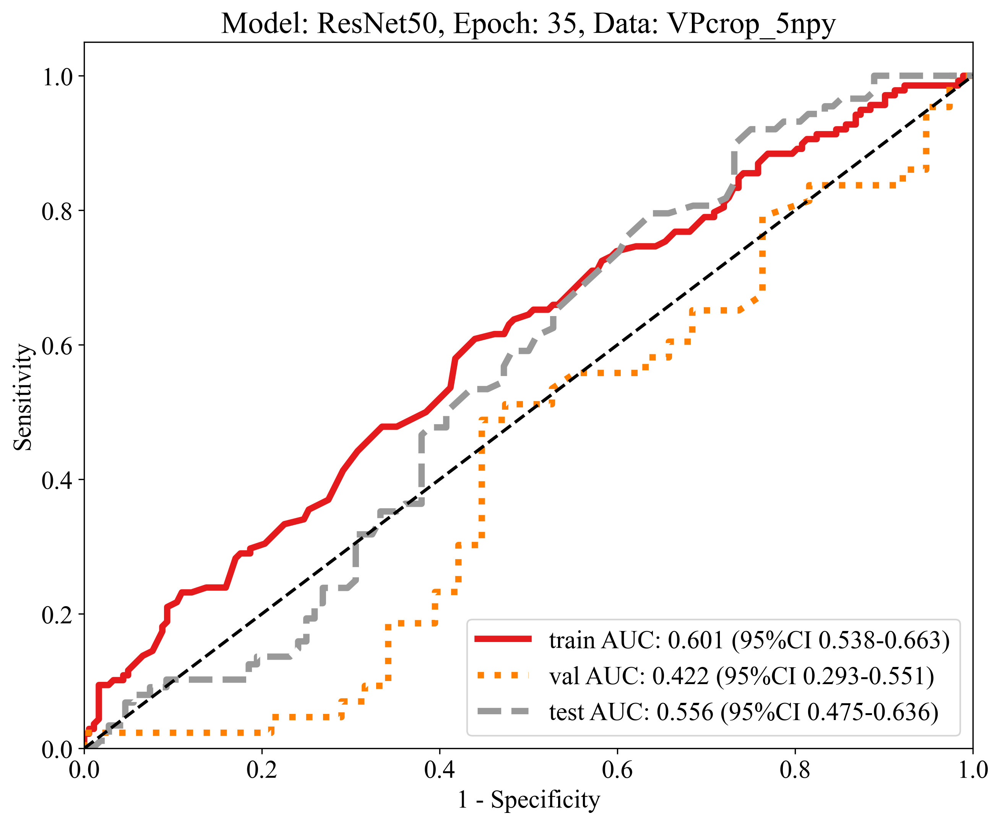

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.581,0.601,0.5384-0.6631,0.609,0.560,0.512,0.654,0.512,0.609,0.556,0.466,train,35
1,resnet50,0.519,0.422,0.2932-0.5513,0.488,0.553,0.553,0.488,0.553,0.488,0.519,0.513,val,35
2,resnet50,0.551,0.556,0.4751-0.6362,0.920,0.250,0.500,0.794,0.500,0.920,0.648,0.470,test,35


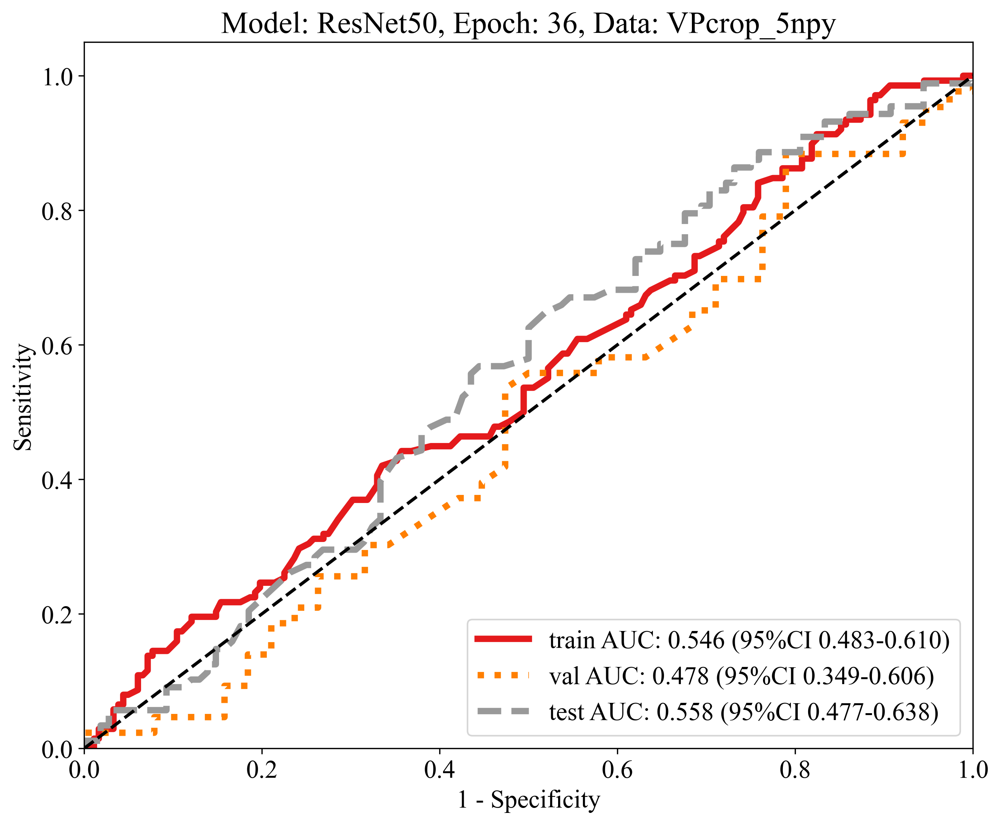

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.494,0.546,0.4829-0.6100,0.913,0.176,0.457,0.727,0.457,0.913,0.609,0.374,train,36
1,resnet50,0.568,0.478,0.3491-0.6062,0.884,0.211,0.559,0.615,0.559,0.884,0.685,0.320,val,36
2,resnet50,0.536,0.558,0.4772-0.6383,0.864,0.269,0.490,0.707,0.490,0.864,0.626,0.399,test,36


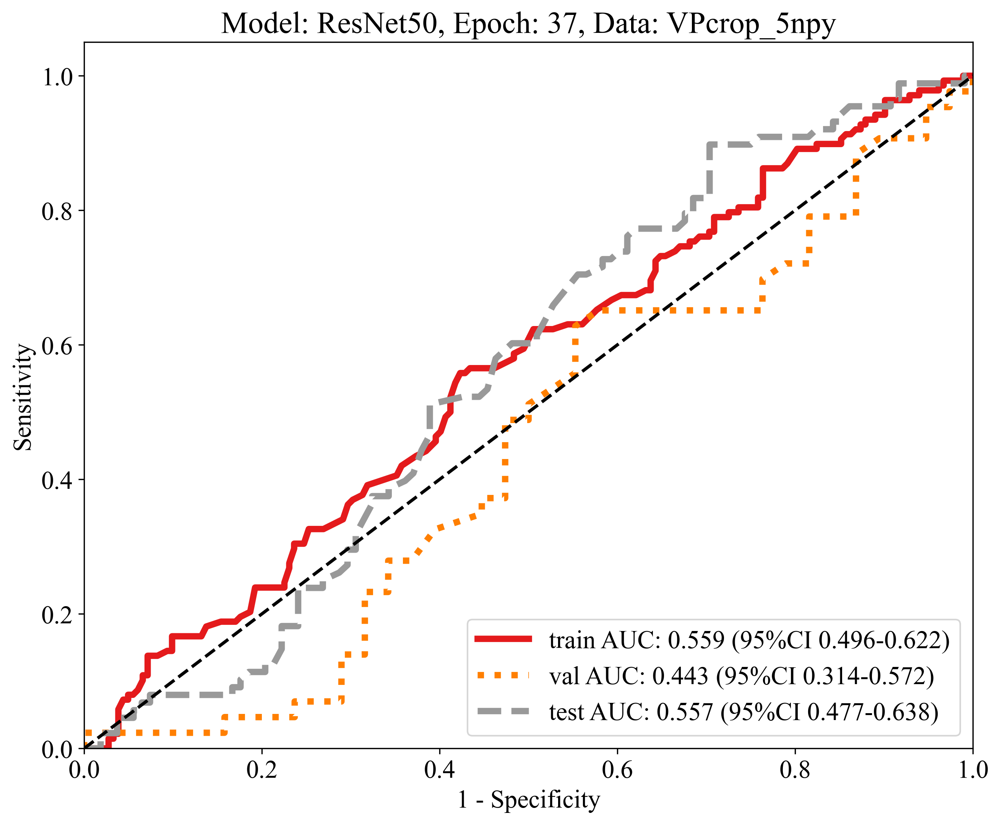

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.569,0.559,0.4959-0.6225,0.558,0.577,0.500,0.633,0.500,0.558,0.527,0.459,train,37
1,resnet50,0.543,0.443,0.3138-0.5717,0.628,0.447,0.562,0.515,0.562,0.628,0.593,0.456,val,37
2,resnet50,0.566,0.557,0.4768-0.6380,0.898,0.296,0.510,0.780,0.510,0.898,0.650,0.427,test,37


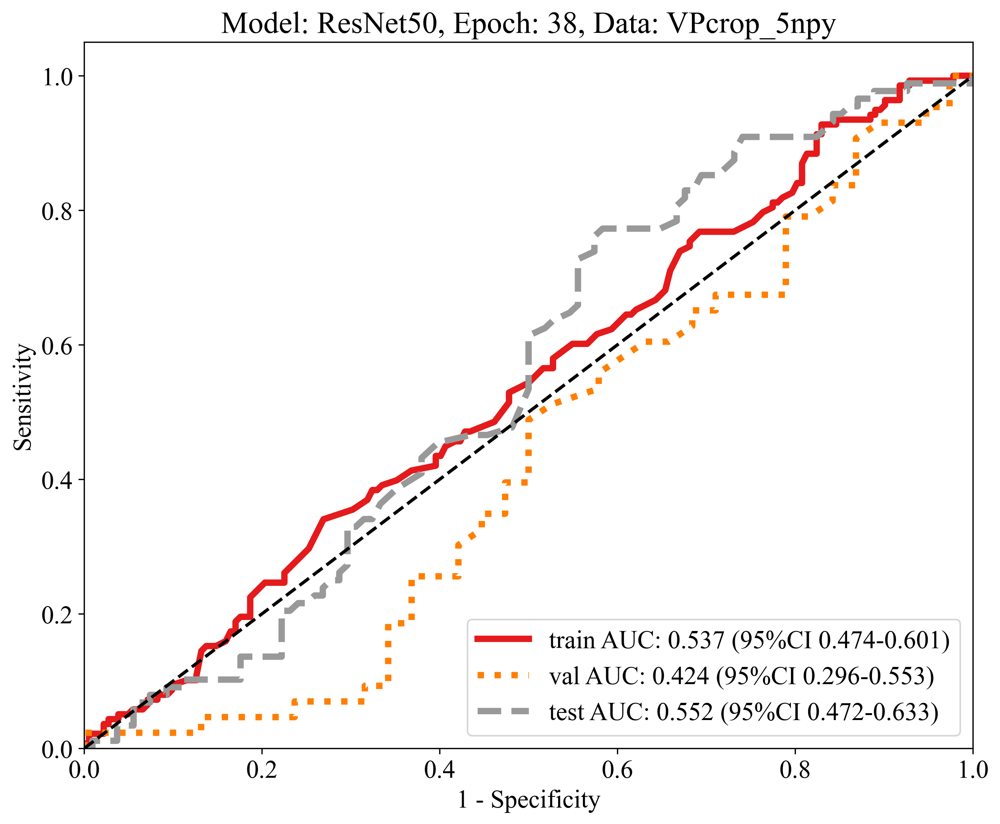

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.497,0.537,0.4738-0.6008,0.928,0.170,0.459,0.756,0.459,0.928,0.614,0.384,train,38
1,resnet50,0.543,0.424,0.2957-0.5531,0.907,0.132,0.542,0.556,0.542,0.907,0.678,0.378,val,38
2,resnet50,0.577,0.552,0.4715-0.6330,0.773,0.417,0.519,0.692,0.519,0.773,0.621,0.463,test,38


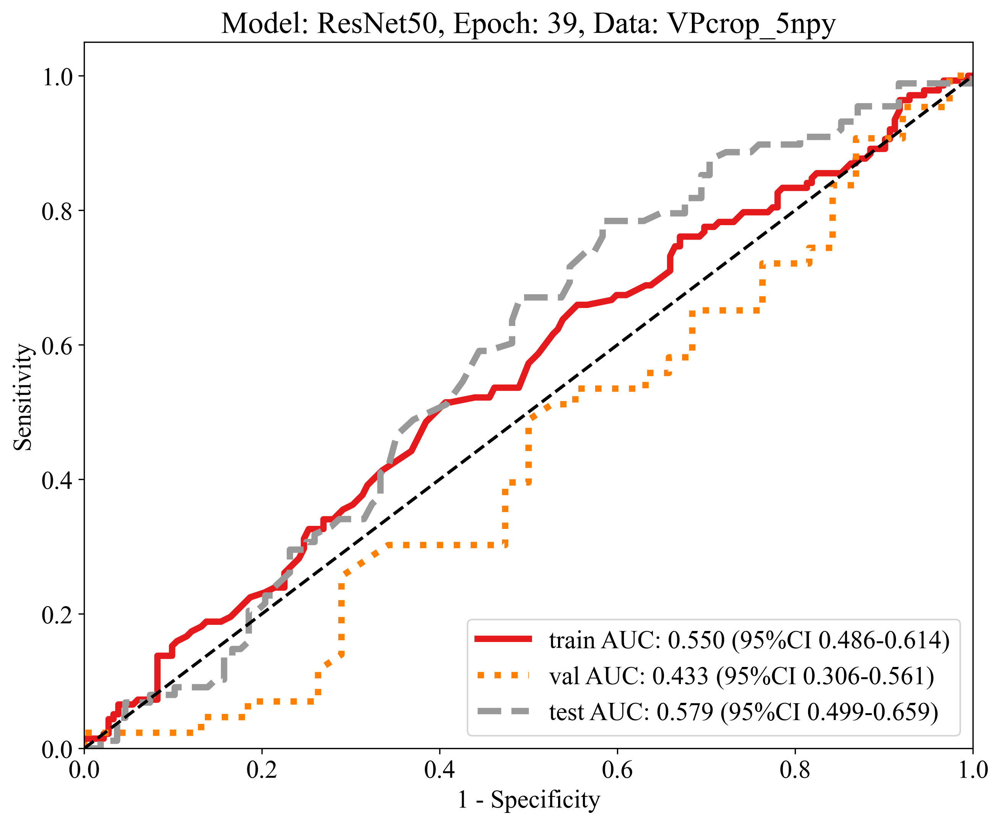

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.559,0.550,0.4860-0.6135,0.514,0.593,0.490,0.617,0.490,0.514,0.502,0.467,train,39
1,resnet50,0.543,0.433,0.3056-0.5610,0.907,0.132,0.542,0.556,0.542,0.907,0.678,0.327,val,39
2,resnet50,0.582,0.579,0.4992-0.6593,0.784,0.417,0.523,0.703,0.523,0.784,0.627,0.434,test,39


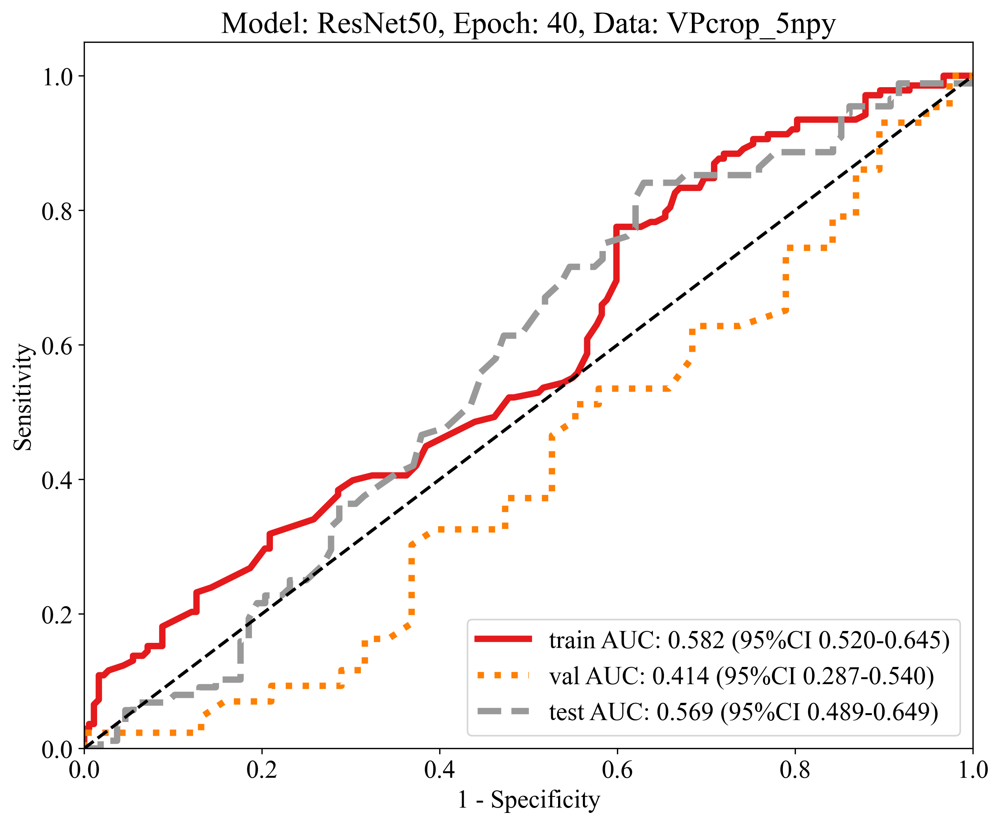

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.562,0.582,0.5197-0.6452,0.775,0.401,0.495,0.702,0.495,0.775,0.605,0.437,train,40
1,resnet50,0.543,0.414,0.2871-0.5403,0.930,0.105,0.541,0.571,0.541,0.930,0.684,0.323,val,40
2,resnet50,0.582,0.569,0.4886-0.6494,0.841,0.370,0.521,0.741,0.521,0.841,0.643,0.437,test,40


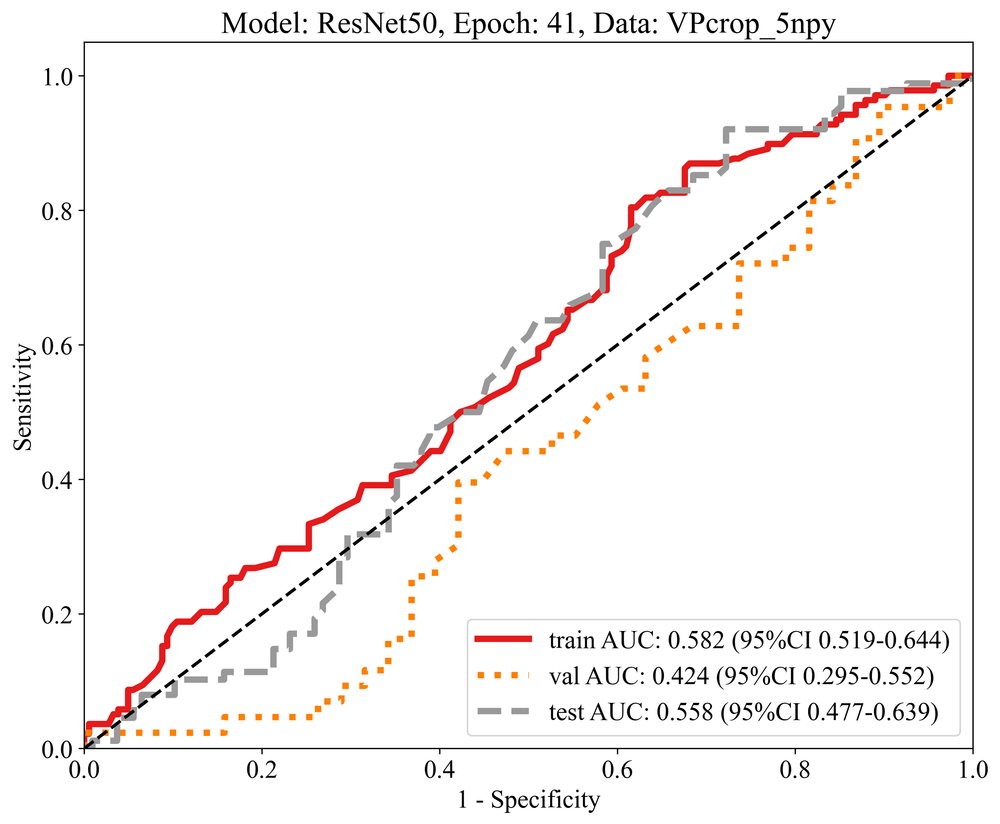

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.566,0.582,0.5192-0.6440,0.804,0.385,0.498,0.722,0.498,0.804,0.615,0.414,train,41
1,resnet50,0.556,0.424,0.2950-0.5520,0.953,0.105,0.547,0.667,0.547,0.953,0.695,0.379,val,41
2,resnet50,0.566,0.558,0.4774-0.6387,0.920,0.278,0.509,0.811,0.509,0.920,0.656,0.447,test,41


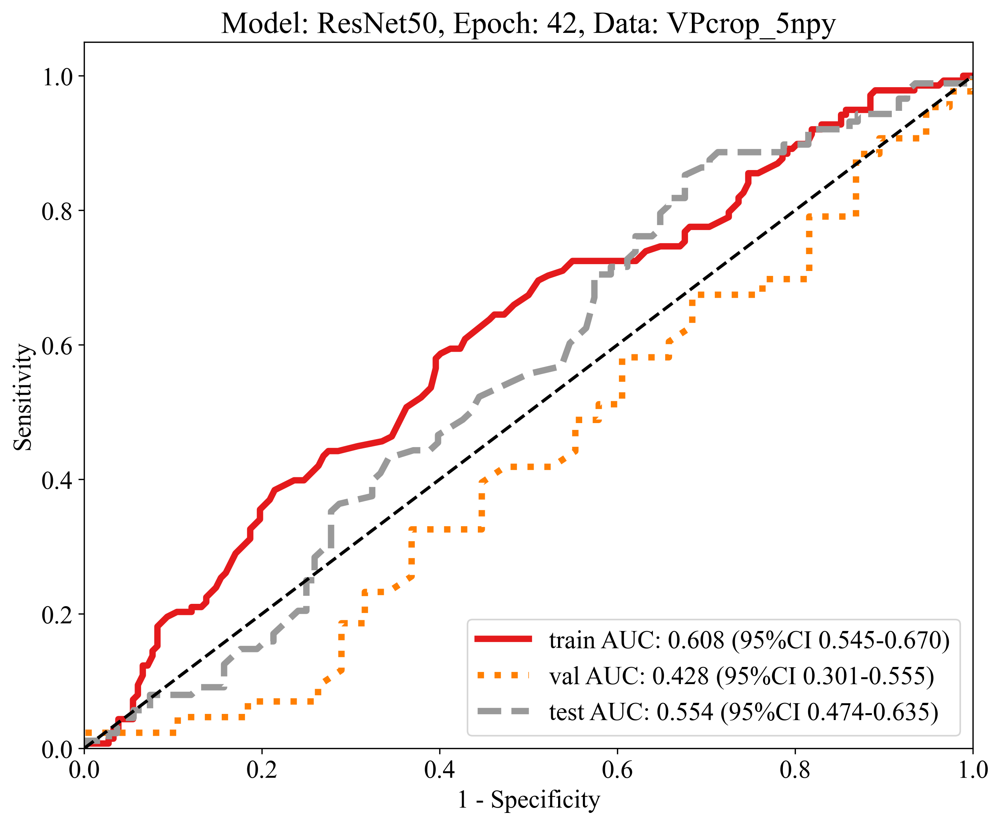

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.594,0.608,0.5454-0.6699,0.587,0.599,0.526,0.657,0.526,0.587,0.555,0.459,train,42
1,resnet50,0.481,0.428,0.3010-0.5552,0.023,1.000,1.000,0.475,1.000,0.023,0.045,0.992,val,42
2,resnet50,0.561,0.554,0.4735-0.6348,0.852,0.324,0.507,0.729,0.507,0.852,0.636,0.417,test,42


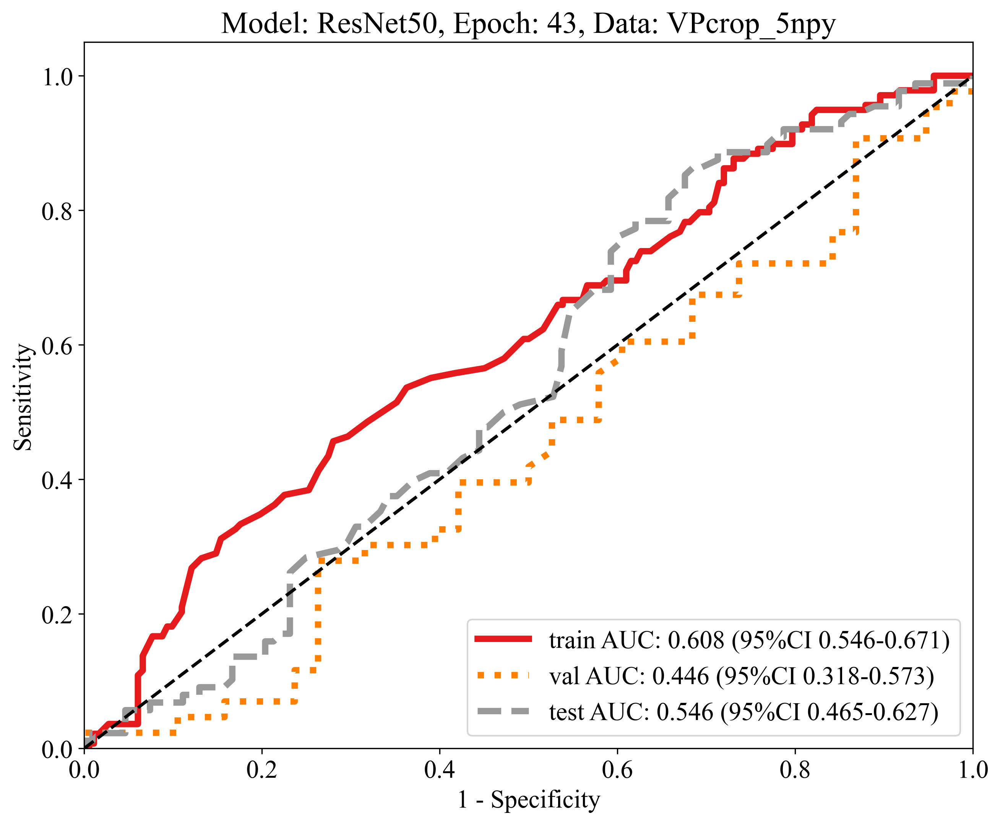

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.606,0.608,0.5463-0.6705,0.457,0.720,0.553,0.636,0.553,0.457,0.500,0.464,train,43
1,resnet50,0.543,0.446,0.3180-0.5731,0.907,0.132,0.542,0.556,0.542,0.907,0.678,0.301,val,43
2,resnet50,0.561,0.546,0.4652-0.6269,0.864,0.315,0.507,0.739,0.507,0.864,0.639,0.415,test,43


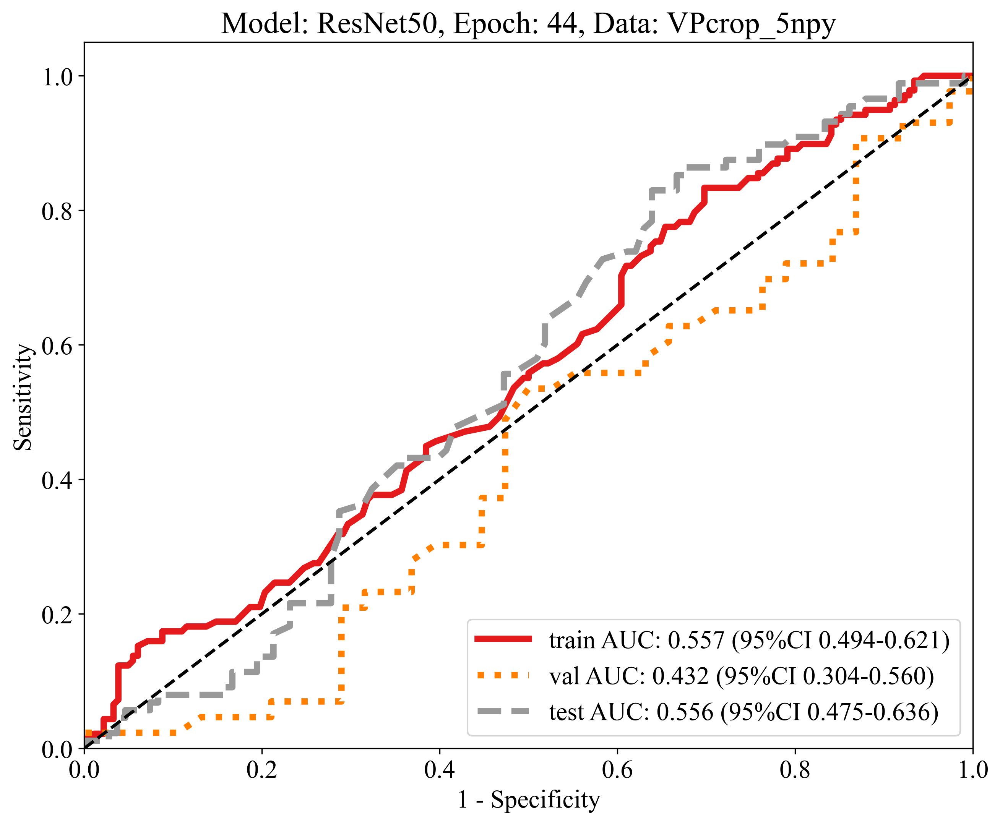

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.531,0.557,0.4943-0.6206,0.833,0.302,0.475,0.705,0.475,0.833,0.605,0.419,train,44
1,resnet50,0.543,0.432,0.3040-0.5596,0.907,0.132,0.542,0.556,0.542,0.907,0.678,0.331,val,44
2,resnet50,0.571,0.556,0.4750-0.6363,0.830,0.361,0.514,0.722,0.514,0.830,0.635,0.438,test,44


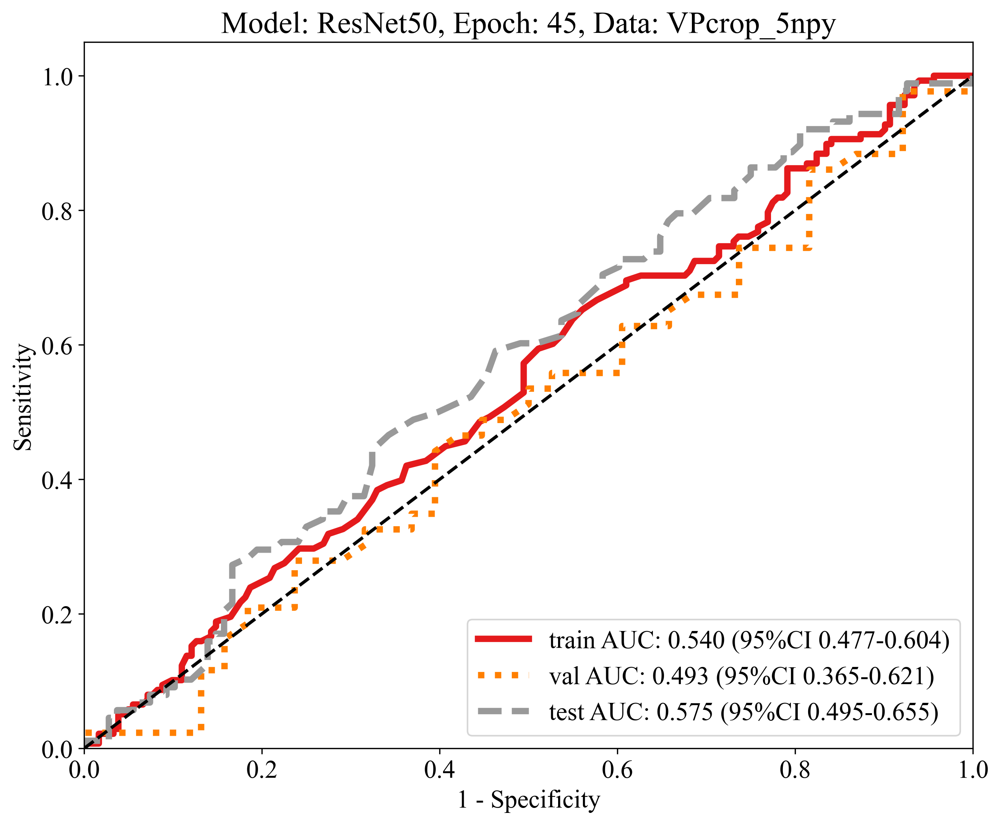

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.531,0.540,0.4769-0.6041,0.652,0.440,0.469,0.625,0.469,0.652,0.545,0.446,train,45
1,resnet50,0.556,0.493,0.3645-0.6208,0.977,0.079,0.545,0.750,0.545,0.977,0.700,0.194,val,45
2,resnet50,0.541,0.575,0.4945-0.6549,0.795,0.333,0.493,0.667,0.493,0.795,0.609,0.418,test,45


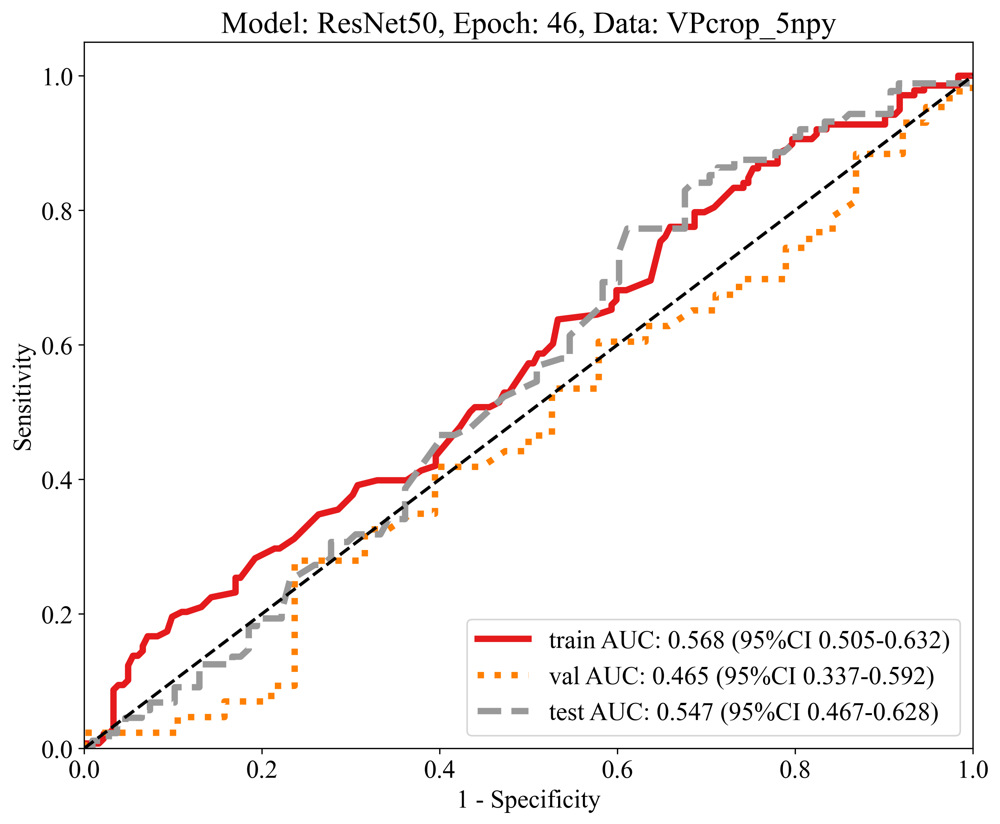

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.528,0.568,0.5052-0.6315,0.775,0.341,0.471,0.667,0.471,0.775,0.586,0.428,train,46
1,resnet50,0.506,0.465,0.3366-0.5924,0.279,0.763,0.571,0.483,0.571,0.279,0.375,0.480,val,46
2,resnet50,0.561,0.547,0.4666-0.6279,0.773,0.389,0.507,0.677,0.507,0.773,0.613,0.430,test,46


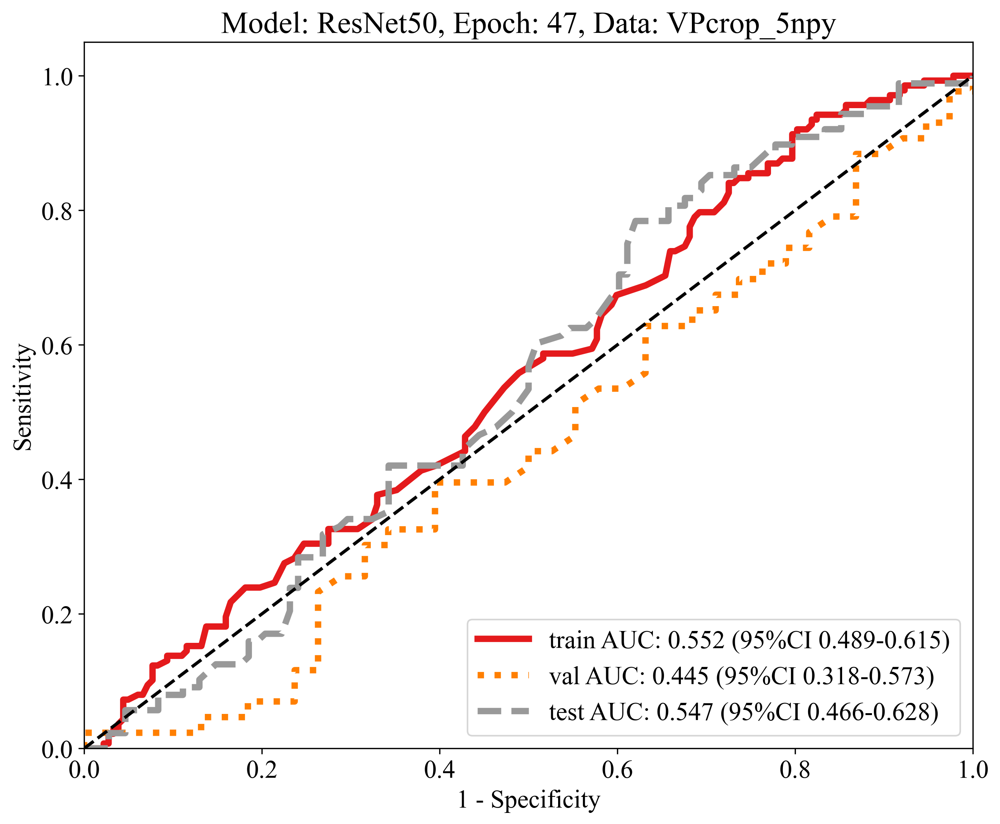

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.509,0.552,0.4890-0.6151,0.920,0.198,0.465,0.766,0.465,0.920,0.618,0.392,train,47
1,resnet50,0.481,0.445,0.3178-0.5727,0.023,1.000,1.000,0.475,1.000,0.023,0.045,0.992,val,47
2,resnet50,0.561,0.547,0.4661-0.6275,0.784,0.380,0.507,0.683,0.507,0.784,0.616,0.427,test,47


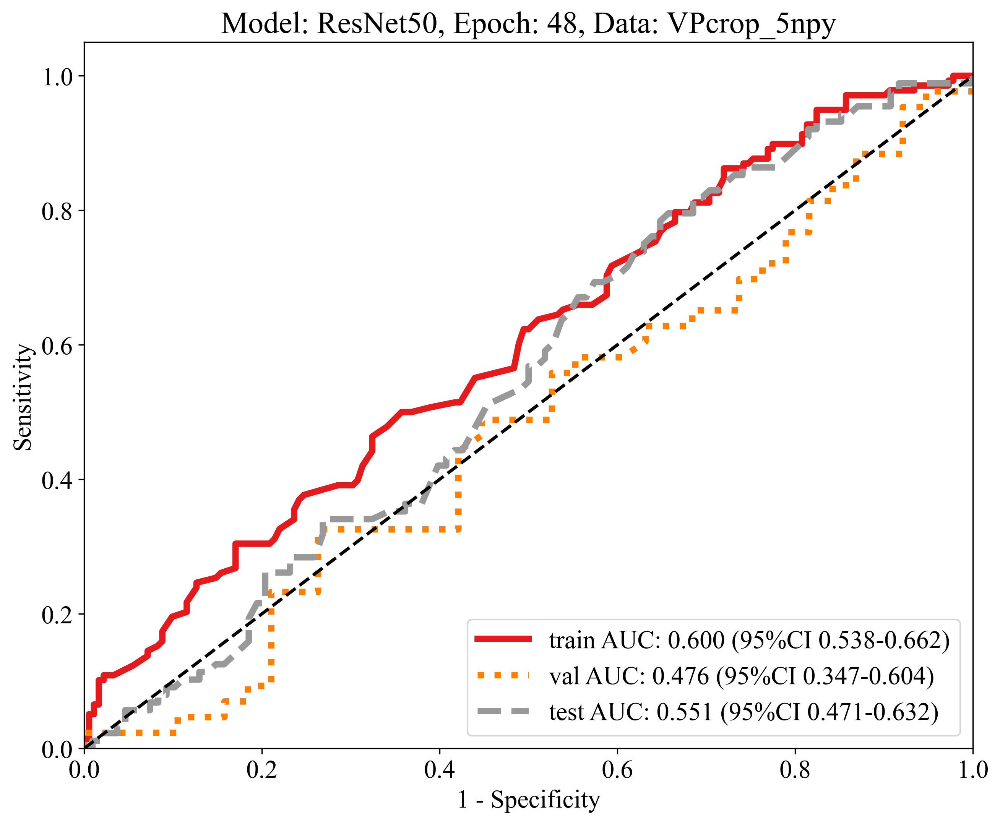

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.581,0.600,0.5375-0.6619,0.500,0.643,0.515,0.629,0.515,0.500,0.507,0.454,train,48
1,resnet50,0.519,0.476,0.3473-0.6037,0.326,0.737,0.583,0.491,0.583,0.326,0.418,0.476,val,48
2,resnet50,0.546,0.551,0.4707-0.6319,0.795,0.343,0.496,0.673,0.496,0.795,0.611,0.417,test,48


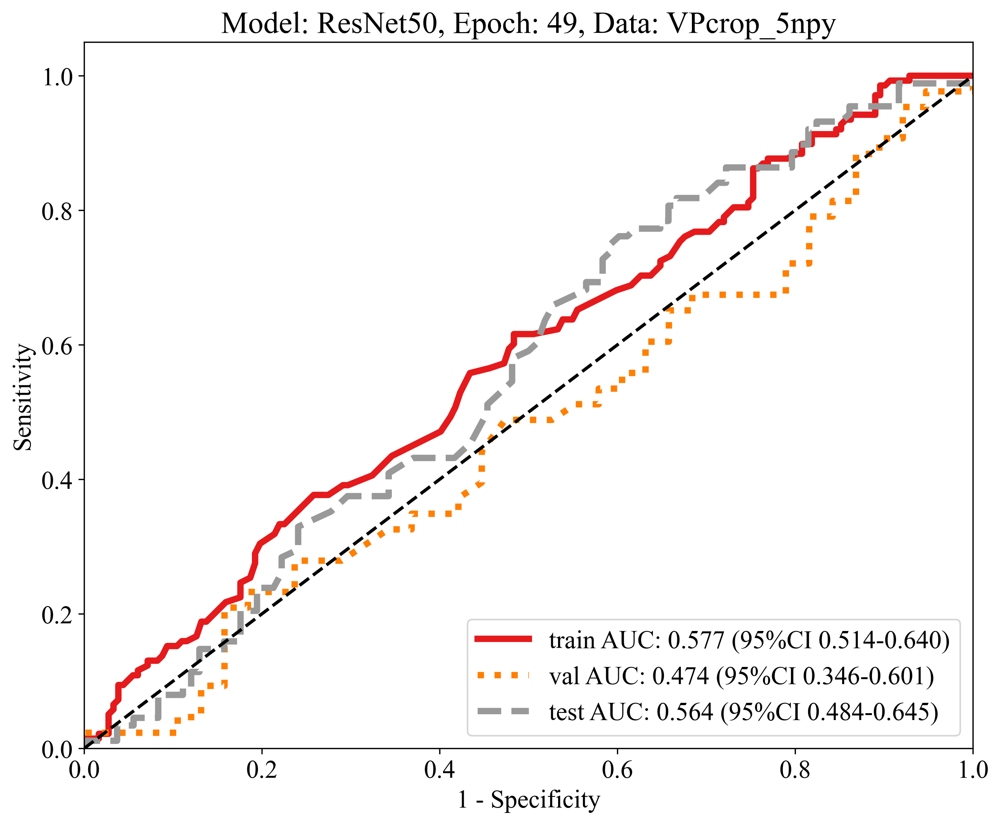

,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.559,0.577,0.5140-0.6397,0.616,0.516,0.491,0.639,0.491,0.616,0.547,0.443,train,49
1,resnet50,0.506,0.474,0.3460-0.6014,0.209,0.842,0.600,0.485,0.600,0.209,0.310,0.484,val,49
2,resnet50,0.561,0.564,0.4839-0.6446,0.761,0.398,0.508,0.672,0.508,0.761,0.609,0.433,test,49


,ModelName,Acc,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Youden,Cohort,Epoch
0,resnet50,0.478,0.466,0.4028-0.5298,0.833,0.209,0.444,0.623,0.444,0.833,0.579,0.002,train,0
1,resnet50,0.556,0.517,0.3889-0.6448,0.535,0.579,0.590,0.524,0.590,0.535,0.561,0.055,val,0
2,resnet50,0.500,0.479,0.3979-0.5609,0.932,0.148,0.471,0.727,0.471,0.932,0.626,0.043,test,0
0,resnet50,0.528,0.507,0.4433-0.5703,0.616,0.462,0.464,0.613,0.464,0.616,0.530,0.044,train,1
1,resnet50,0.642,0.598,0.4709-0.7244,0.907,0.342,0.609,0.765,0.609,0.907,0.729,0.092,val,1
2,resnet50,0.597,0.580,0.4987-0.6618,0.568,0.620,0.549,0.638,0.549,0.568,0.559,0.520,test,1
0,resnet50,0.581,0.592,0.5294-0.6552,0.768,0.440,0.510,0.714,0.510,0.768,0.613,0.146,train,2
1,resnet50,0.494,0.378,0.2542-0.5016,0.047,1.000,1.000,0.481,1.000,0.047,0.089,1.000,val,2
2,resnet50,0.469,0.449,0.3670-0.5303,1.000,0.037,0.458,1.000,0.458,1.000,0.629,0.759,test,2
0,resnet50,0.487,0.464,0.4004-0.5270,0.754,0.286,0.444,0.605,0.444,0.754,0.559,0.033,train,3


In [3]:
import pandas as pd
import numpy  as np
import re
from onekey_algo.custom.components import metrics
from onekey_algo.custom.components.comp1 import draw_roc, normalize_df
from matplotlib import pyplot as plt
from onekey_algo.custom.utils import print_join_info


pd.set_option('display.max_rows', None)
def get_log(log_path, map2gz:bool = True):
    log_ = pd.read_csv(log_path, names=['fname', 'pred_score', 'pred_label', 'gt'], sep='\t')
    if map2gz:
        log_['ID'] = log_['fname'].map(lambda x: os.path.splitext(os.path.basename(x))[0] + '.gz')
    else:
        log_['ID'] = log_['fname'].map(lambda x: os.path.basename(x))
    return log_

def map_mn(x):
    return x.replace('densen', 'DenseN').replace('resnet', 'ResNet').replace('vgg', 'VGG').replace('inception_v3', 'InceptionV3')

all_log_ = []
metrics_dfs = []
for data_pattern in [get_param_in_cwd('data_pattern')]:
    for epoch_ in range(0, get_param_in_cwd('epoch')):
        metric_results = []
        all_preds = []
        all_gts = []
        all_model_names = []
        for model in sel_models:
            all_pred = []
            all_gt = []
            all_groups = []
            # 评估的事viz的最佳非训练集表现的模型
    #         val_log = pd.concat([get_log(os.path.join(model_root, model, f"viz/BST_TRAIN_RESULTS.txt")),
    #                             get_log(os.path.join(model_root, model, f"viz/BST_VAL_RESULTS.txt"))], axis=0)
            # 指定epoch评估的模型
            val_log = pd.concat([get_log(os.path.join(model_root, model, f"train/Epoch-{epoch_}.txt")),
                                 get_log(os.path.join(model_root, model, f"valid/Epoch-{epoch_}.txt"))], axis=0)
            val_log = pd.merge(val_log.drop_duplicates('ID'), group_info, on='ID', how='inner')
            val_log['gt'] = val_log['label']
            val_log['model'] = f"{model}"
            ug_groups = subsets
            ul_labels = np.unique(val_log['pred_label'])
            for g in ug_groups:
                sub_group = val_log[val_log['group'] == g]
                sub_group['label-1'] = list(map(lambda x: x[0] if x[1] == 1 else 1-x[0], 
                                                np.array(sub_group[['pred_score', 'pred_label']])))
                sub_group['label-0'] = 1 - sub_group['label-1']
#                 sub_group[['ID', 'label-0', 'label-1']].to_csv(os.path.join('results', f'DL_{model}_{g}_{epoch_}.csv'), index=False)
                all_groups.append(g)                    
                all_log_.append(sub_group)
                for ul in [1]:
                    pred_score = np.array(sub_group['label-1'])
                    gt = [1 if gt_ == ul else 0 for gt_ in np.array(sub_group['gt'])]
                    acc, auc, ci, tpr, tnr, ppv, npv, p, r, f1, thres = metrics.analysis_pred_binary(gt, pred_score, use_youden=True)
                    ci = f"{ci[0]:.4f}-{ci[1]:.4f}"
                    metric_results.append([model, acc, auc, ci, tpr, tnr, ppv, npv, p, r, f1, thres, g])
                    all_pred.append(pred_score)
                    all_gt.append(gt)
            # 绘制每个模型的ROC
            draw_roc(all_gt, all_pred, labels=all_groups, title=f"Model: {map_mn(model)}, Epoch: {epoch_}, Data: {os.path.basename(data_pattern)}")
            plt.savefig(f'img/DL_{model}_{epoch_}roc.svg', bbox_inches='tight')
            plt.show()
            # 整合到所有模型汇总。
            all_preds.extend(all_pred)
            all_gts.extend(all_gt)
            all_model_names.append(model)
        # for gi, g in enumerate(all_groups):
        #     draw_roc(all_gts[gi::len(all_groups)], all_preds[gi::len(all_groups)], 
        #              labels=[map_mn(m) for m in all_model_names], 
        #              title=f"Cohort {g}")
        #     plt.savefig(f'img/DL_{g}_{epoch_}roc.svg', bbox_inches='tight')
        #     plt.show()
        metrics_df = pd.DataFrame(metric_results, 
                                  columns=['ModelName', 'Acc', 'AUC', '95% CI', 'Sensitivity', 'Specificity', 'PPV', 'NPV', 
                                           'Precision', 'Recall', 'F1',
                                           'Youden', 'Cohort'])
        metrics_df['Epoch'] = epoch_
        display(metrics_df)
        metrics_dfs.append(metrics_df)
pd.concat(metrics_dfs, axis=0)